<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------
Student numbers: <span style="color:red">r0865044, r0891286, r0875700, u0129743, r0763248</span>.

<!-- In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. The notebook you submit for grading is the last notebook you submit in the [Kaggle competition](https://www.kaggle.com/t/d11be6a431b84198bc85f54ae7e2563f) prior to the deadline on **Tuesday 24 May 23:59**. Closely follow [these instructions](https://github.com/gourie/kaggle_inclass) for joining the competition, sharing your notebook with the TAs and making a valid notebook submission to the competition. A notebook submission not only produces a *submission.csv* file that is used to calculate your competition score, it also runs the entire notebook and saves its output as if it were a report. This way it becomes an all-in-one-place document for the TAs to review. As such, please make sure that your final submission notebook is self-contained and fully documented (e.g. provide strong arguments for the design choices that you make). Most likely, this notebook format is not appropriate to run all your experiments at submission time (e.g. the training of CNNs is a memory hungry and time consuming process; due to limited Kaggle resources). It can be a good idea to distribute your code otherwise and only summarize your findings, together with your final predictions, in the submission notebook. For example, you can substitute experiments with some text and figures that you have produced "offline" (e.g. learning curves and results on your internal validation set or even the test set for different architectures, pre-processing pipelines, etc). We advise you to first go through the PDF of this assignment entirely before you really start. Then, it can be a good idea to go through this notebook and use it as your first notebook submission to the competition. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions. Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*. -->


# 1. Overview
In this notebook we will experiment with image classitication and segmentation models. For this, we will be working with a subset of the PASCAL VOC2009 dataset. In detail, classification and segmentation models will be trained from scratch and using more sophisticated techniques to fit and generalize the information of a subset of 750 images of this dataset.

This notebook consists of *five main parts*:
* Dataset description and visualization (Sect. 1)
* Image classification (Sect. 2)
* Semantic segmentation (Sect. 3)
* Adversarial attacks (Sect. 4)
* Discussion (Sect. 5)

In the first part, the dataset we will be working with is introduced. Additionally, some images are shown along with their labels. In the second part, image **classification models** are trained specifically designed for working with the PASCAL datast. Similarly in the third part, the PASCAL dataset is used for training **segmentation models**. Next in section four, **adversarial attacks** are studied and evaluated. Finally, in section five an extensive discussion is provided evaluating the outcomes, advantages and disadvantages of the models.

To start with, lets install some useful packages:
- gdown: Lets download files using URLs, this is useful for getting the necessary files.
- tensorflow examples: We use this for using transfer learning in the segmentation section.
- Focal-loss: it is a special loss used for the segmentation section.

In [ ]:
%%capture
!pip install gdown
!pip install git+https://github.com/tensorflow/examples.git
!pip install focal-loss

## 1.1 Basic packages and Deep learning resources
For this notebook, we will be using standard packages/libraries such as cv2, numpy, matplotlib. Additionally specialized libraries as TensorFlow and Keras are used as well, along with some other deep learning libraries that are compatible with Keras.

In [ ]:
import cv2
import os
import gdown
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_datasets as tfds
from matplotlib import pyplot as plt
from focal_loss import SparseCategoricalFocalLoss
from tensorflow_examples.models.pix2pix import pix2pix
from IPython.display import clear_output
import time
from sklearn.model_selection import train_test_split
from tensorflow import keras
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate
from tensorflow.keras.models import Model
from focal_loss import SparseCategoricalFocalLoss
np.random.seed(23)

AUTOTUNE = tf.data.experimental.AUTOTUNE

In [ ]:
%%capture
url = "https://drive.google.com/file/d/13S5qRQGZTavhoi-DWUZ43-Cf0HjInHg-/view?usp=sharing"
gdown.download(url=url, output='dataset.zip', quiet=False, fuzzy=True)
url = "https://drive.google.com/file/d/1ucYYDNIw9wYcOD-0Kh5lrQCUS1jZXNYd/view?usp=sharing"
gdown.download(url=url, output='unet_weighted_focalloss.h5', quiet=False, fuzzy=True)
!unzip dataset.zip -d kul-h02a5a-computer-vision-ga2-2022/
url = "https://drive.google.com/uc?export=view&id=19H1qqNKcUtr_0GkuAufktcqidfzpV4hL"
gdown.download(url=url, output='checkpoint_85', quiet=False, fuzzy=True)
url = "https://drive.google.com/uc?export=view&id=144RSxRKP_U2oy8hXNGhw4X89R8trQKFw"
gdown.download(url=url, output='cnn_from_scratch.zip', quiet=False, fuzzy=True)
url = "https://drive.google.com/uc?export=view&id=1xO29n8_OTNV4MVNA4pl2aKmYa1IZ9vhY"
gdown.download(url=url, output='adv_attack', quiet=False, fuzzy=True)
url = "https://drive.google.com/uc?export=view&id=1GQ8uKrT8tHF3zareHrHA9QHM_ytKi2fl"
gdown.download(url=url, output='bike.npy', quiet=False, fuzzy=True)
url = "https://drive.google.com/uc?export=view&id=1V9HHS5ZiU7oFHoHnlZBbPm52OJf8Hj6a"
gdown.download(url=url, output='plane.npy', quiet=False, fuzzy=True)
url = "https://drive.google.com/file/d/1Z7-UyHW7RVl22t8tZTsg53iVzZBESiVI/view?usp=sharing"
gdown.download(url=url, output='unet_TL.zip', quiet=False, fuzzy=True)
!unzip unet_TL.zip

## 1.2 PASCAL VOC 2009
PASCAL stands for Pattern Analysis, Statistical Modelling and Computational Learning, a project coordinated by the university of Southampton in the UK. It is part of the Network of Excellence initiative of the European Commission funding and stimulating research and technological development. In 2009 they organised the Visual Object Classes Challenge 2009 (or VOC2009), a challenge to recognize objects from a number of classes from common pictures. 

A labelled training set is provided, divided into twenty classes for detection, classification and segmentation. 

Below we list these classes together with an example:

<table>
  <tr>
     <td><img src="https://drive.google.com/uc?export=view&id=1-0SNZNBUVTOyUrZsdCL4lkLtFgcscaZf" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=13BCguCWgkJ1BIyGWI8Z-WMmaJbd8qKx3" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=14xZPFYigf5mOJT_Iije9q6lMXSSphJp7" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=16a6D8GiJvJ-eFq4EHQ1HONHSsuFroRiE" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=17lyMXCihVLb2Z6Tpbk6WExT6k0Laf-28" ></td>
  </tr>
  <tr>
     <td><img src="https://drive.google.com/uc?export=view&id=18zm1glu7tJp224KP8E-f69h4OqrEBZhX" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1EGf1F6WCP1Fmv5Gtt4CjfXZslEd7_Hk1" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1J5NmeA2BEJBCzmUbQ8LI7S-Yybw6_eqy" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1K_q5qH4bupPeBPdgrqjY2dPzLZ07_QfV" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1Mu-dUd-8gfek514S1NFTrLo4UUUDVFQ_" ></td>
  </tr>
  <tr>
     <td><img src="https://drive.google.com/uc?export=view&id=1QmSS03BX2Nl3qBiWsTxuZtY5jGSPYt81" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1TZw-EqNmbOL4UFFt7rKC-z3-rEFHDHMQ" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1Xj_6e62jfZWzNNCLsMPo2kUzX2tsrYWC" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1bIqp9kY2kyLWwJ-22-6gUe0OkLELqAEp" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1kIqCDuI5Gv3Fq_v3M1xWtwOOE4vw_Jc-" ></td>
  </tr>
  <tr>
     <td><img src="https://drive.google.com/uc?export=view&id=1ovFIW9ER7D1eNIjD8lVtv3POL8O79_wV" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1qKFTD1Py-hL8SAU4n49NWyabhhCdyOFX" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1uM2zS8txikkR6VsKXREaJFih976a8jdk" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1vEENECbWzM_W_y6OWRh1p5Pu2UDiCNXV" ></td>
     <td><img src="https://drive.google.com/uc?export=view&id=1x079LLpz1FLG58uBL0XntTo6hrI99g8v" ></td>
  </tr>
 </table>

First a labelled training and validation dataset was provided, on which participants could train their models. Afterwards the test data was published, without a ground truth. 

The whole dataset is uniformly distributed over the different classes. **We however do not work with the full dataset**, but with a very small subset of 750 samples in total, which is a reduced portion, compared to the 14,743 samples in the full dataset. We will therefore make sure to do some data inspection: test whether our classes are equally distributed and, if not, compensate for it using techniques designed to cope with reduced amounts of data. 

## 1.3. Data loading
Lets first get our hands on the training dataset we are going to use: we read the labels from the `train_set.csv` file and use it to structure `train_df` and make a list of all the class names. Afterwards, we fill the `img` and `seg` columns of `train_df` by loading in the `.npy` files from the `train/` directory. The resulting dataframe has an amount of rows equal to the number of images. Each row has 22 columns, the first 20 for binary encoding of the label, then one for the image, and the final one for the segmentation(s).    

In [ ]:
# Loading the training data
# directory = 'kaggle/input/kul-h02a5a-computer-vision-ga2-2022/kul-h02a5a-computer-vision-ga2-2022/'
directory = 'kul-h02a5a-computer-vision-ga2-2022/'
train_df = pd.read_csv(os.path.join(directory, 'train/train_set.csv'), index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load(os.path.join(directory,'train/img/train_{}.npy').format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load(os.path.join(directory,'train/seg/train_{}.npy').format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))
train_df.head(1)

The training set contains 749 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


And now we repeat the same for the test set. Do note however that all labels consist of 20 `-1`s denoting that the label is unknown. Similarly, the segmentation column is filled with arrays of `-1`.

In [ ]:
# Loading the test data
test_df = pd.read_csv(os.path.join(directory, 'test/test_set.csv'), index_col="Id")
test_df["img"] = [np.load(os.path.join(directory, f'test/img/test_{idx}.npy')) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 1.4. Initial Visualization

Now that the training and test dataset have been defined, here, we plot some images, along with the classification labels and the segmentation maps as a means of familiarizing ourselves with the data. The 20 labels are contained in 20 columns, while the segmentation map is a x by y image that can take integer values between 0 and 20. X and y are the dimensions of the images and differ between images. 

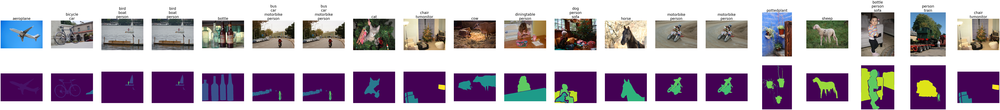

In [ ]:
# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

##1.5 Data inspection
We now plot the dimensions and the aspect ratio of all images. We see that there is quite a bit of variability in the image sizes and aspect ratios. We will have to process the data to a uniform size before feeding it into the classification and segmentation networks.

In [ ]:
ratios = []
widths = []
heights = []
for i in range(len(train_df)):
    print(f'Processing {i+1}/{len(train_df)} sample', end='\r')
    image = train_df.iloc[i]['img'][:,:,::-1]
    mask  = train_df.iloc[i]['seg']
    h, w, _ = image.shape
    ratios.append(w/h)
    widths.append(w)
    heights.append(h)

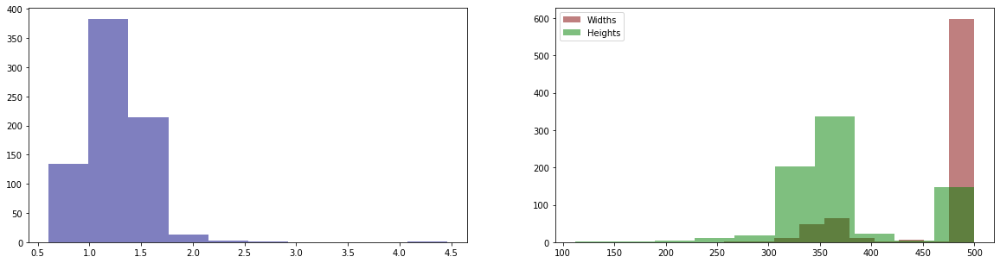

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(121);
plt.hist(ratios, color=(0.0,0,0.5,0.5), label='Ratio W/H');
plt.subplot(122);
plt.hist(widths, color=(0.5,0,0,0.5), label='Widths');
plt.hist(heights, color=(0, 0.5,0,0.5), label='Heights');
plt.legend()

As it can be seen the ratios and sizes of the images are not equally distributed. Thus, special care was taken when training the classification and segmentation models. Specifically, the images were resized to fit the classification models. Whereas in the case of segmentation, they were both resized and cropped. The **cropping was possible since this step was applied to the RGB image and the segmentation mask**.

## 1.6 Your Kaggle submission
Here two functions are defined to submit the classification and segmentation predictions to the Kaggle competence.

In [ ]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 2. Image classification

## 2.1. Introduction

### 2.1.1 Definition
First and foremost, what are we talking about? Image classification is the process of finding out what visual classes are present in parts of an image. The algorithm **recognizes** a part of an image as belonging to a class and **classifies** the image as such. An image should thus be classified as a dog if it contains dogs.

<div align=center>
    <img width=250 src="https://drive.google.com/uc?export=view&id=1_NzRP60eNl7OuKbjZLVpRpHKWVhwKnDb">
</div>  

[source](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/examples/images/dog_01.jpg)

### 2.1.3 Challenges
Contrary to what one might believe image classification is a hard problem. There does not exist a silver bullet: no one algorithm can efficiently perform classification and no one algorithm supplies a **general solution** to the problem. 

When looking at pictures one also needs to keep in mind **additional issues** like  the following:
<table>
  <tr>
     <td>occlusion</td>
     <td>viewpoint variation</td>
     <td>scale</td>
     <td>deformation</td>
  </tr>
  <tr>
     <td><img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTXLuHq9qHbYcJsLbl896xB3rjCVQTRwT4fjg&usqp=CAU" width=300 ></td>
     <td><img src="https://www.researchgate.net/profile/Luc-Van-Gool/publication/226106057/figure/fig1/AS:302375534383107@1449103353755/Two-different-views-of-the-same-object-with-some-invariant-regions-overlayed-red.png" width=300></td>
     <td><img src="https://cdn-ajggd.nitrocdn.com/kMoOFpDlsOVtlYJLrnSRNCQXaUFHZPTY/assets/static/optimized/rev-536aa32/wp-content/uploads/2020/10/forced-perspective-2.jpg"width=300></td>
     <td><img src="https://external-preview.redd.it/5tDK8oGmSOKM-nAlm_13Tm6xiSAgY7LclxfoeIjPCWY.jpg?width=960&crop=smart&auto=webp&s=0aac5a8282ce89750122c9185d46cb4430036505"width=300></td>
  </tr>
 </table>

 <table>
  <tr>
     <td>clutter</td>
     <td>illumination</td>
     <td>intra-class variation</td>
  </tr>
  <tr>
     <td><img src="https://cdn.pixabay.com/photo/2016/08/07/16/45/owl-1576572_960_720.jpg" width=300></td>
     <td><img src="https://www3.cs.stonybrook.edu/~cvl/content/illum/illumination03.jpg" width=300></td>
     <td><img src="https://www.researchgate.net/profile/Nizar-Massouh/publication/325311506/figure/fig1/AS:651550879932418@1532353243401/shows-an-example-of-Intra-Class-variation-on-the-Chair-class-But-how-will-a-machine.png"width=300></td>
  </tr>
 </table>

Each of these challenges makes it difficult for image classification algorithms to correctly classify these images.

Note that the problem of **intra-class variation** also arises with the detection of human faces, where all faces belong to the same class. So all faces in the image should be detected. This is however not as easy as it sounds, which was an important take-away from our previous assignment. 

### 2.1.3 How does it work
There exist many different **classical algorithms** for image classification including amongst others sliding window methods, visual words, subspace methods like PCA, gradient based methods like HAAR and HOG,... These latest years there is however a paradigm shift from using premade or predefined features to letting the **algorithm itself define** the relevant features.  

This results in the use of **Machine Learning** in image classification. A filter (or kernel) is slid over the image, and its results are stored in an activation map. When this filter detects a feature for which it is made, it is said to activate and connect to the output. The filter itself can also be modified based on what it send to the output thanks to backpropagation. The input triggers the filter to activate and based on the output the weights on this activation will be modified, allowing the network to learn from examples.

<div align=center>
    <img width=600 src="https://anhreynolds.com/img/cnn.png">
</div>  

[source](https://anhreynolds.com/img/cnn.png)


The layer extracting the features is a **convolutional layer**, while the whole (with a system for backpropagation) is called a [convolutional neural network](https://en.wikipedia.org/wiki/Convolutional_neural_network).

### 2.1.4 Deep Learning
[Deep Learning](https://www.amazon.com/Deep-Learning-Adaptive-Computation-Machine/dp/0262035618/ref=as_li_ss_tl?_encoding=UTF8&qid=&sr=&linkCode=sl1&tag=inspiredalgor-20&linkId=e4e32749958369afb667e7e4323d65ba&language=en_US) further elaborates on these ideas by putting different convolutional layers between input and output:

This is a big step-up from classic techniques for image classification. Together with non-linear activation functions it allows the network to learn very local features from the first convolutional layers and compose combinations of these features in the next layers.

<div align=center>
    <img width=600 src="https://miro.medium.com/max/1400/1*yILgZZxuHnQQhtsK-b1HLQ.png">
</div>   

[source](https://miro.medium.com/max/1400/1*yILgZZxuHnQQhtsK-b1HLQ.png)

One can say that the layers of a deep convolutional neural network form a **hierarchy of features** from simple to a full classifier.

The human is put outside the loop, the algorithm does no longer need to rely on the features a human for it defines. Through supervised learning the algorithm **itself can learn the features**.

### 2.1.5 Other kinds of layers
- **pooling layers**
  are used to reduce the dimensions of data by taking a bundle of weights from neighbouring nodes and combining them into one weight.
  The weights are mostly combined based on maximal or average value.
  <div align=center>
    <img width=600 src="https://media.geeksforgeeks.org/wp-content/uploads/20190721025744/Screenshot-2019-07-21-at-2.57.13-AM.png">
  </div> 

  [source](https://media.geeksforgeeks.org/wp-content/uploads/20190721025744/Screenshot-2019-07-21-at-2.57.13-AM.png)

- **flatten layers**
  reduce the input array/tensor to one dimension and passes it on. Used mostly in an image classifier to portray the features into a layer of just n output nodes (where n is the number of classes).

- **fully connected layers**
  connect every node in one layer to every node in another layer. Such a layer is also called a **dense** layer.  

### 2.1.6 Overfitting
Not all data is created equal, overfitting can easily occur when the amount of training data is low and initial mistakes can be carried on for a long time. **Regularization techniques** are therefore employed to make sure the classifier is more robust. 

One of these techniques is [dropout](https://jmlr.org/papers/v15/srivastava14a.html). At each epoch an amount of random nodes is "dropped" from the model, thus their weights become impossible to train during the epoch. In the next epoch the old node is put back and others are dropped. The classifier is therefore encouraged to learn a more **sparse representation**, and be more sparse in general.

Another technique would be to apply [batch normalization](https://en.wikipedia.org/wiki/Batch_normalization): recentralization and rescaling of inputs to layers. It offers **stabilization by standardizing** the inputs to a layer for each mini-batch.

### 2.1.7 Evaluation metrics
How do we now measure the results of our CNN classifier? There are many different **evaluation metrics**. One thing that is however immediately visible from the PASCAL VOC2009 dataset is that it contains images that are present in **multiple classes**, e.g: an image from the dataset containing both a person and a train.

<div align=center>
    <img width=300 src="https://drive.google.com/uc?export=view&id=1NmvPrhzW-CU4k9bmVIAQaNkRgyT9b2y2">
</div>

We will therefore only focus on the most **commonly used multiclass classification evaluation metrics** taken from [guide on multiclass classification metrics](https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd):

- precision
- recall
- F1

All these metrics have in common that they are defined for binary classification but can be extended to multiclass classification by combining the evaluation of binary classifiers using an averaging technique:
- a simple average of all metrics across classes.
- weighted to account for class imbalance
- using accuracy

Precision and recall are two of the most famous metrics, and are generally well-known among scientists. They do however represent a trade-off: optimizing one might lead to decrease of the other.

The **F1 metric** helps to find out whether a classifier is equally good at **minimizing both false positives and false negatives** in imbalanced classification by taking an harmonic mean of precision and recall. It ensures that the precision and the recall are somewhat similar. 

Keep in mind that F1 is mostly used when dealing with imbalanced classifications. This will be useful later on.

### 2.1.8 Loss functions
There exist many loss functions, we therefore (like before) focus mainly on those most useful for multiclass classification taken from [most important loss functions](https://shiva-verma.medium.com/understanding-different-loss-functions-for-neural-networks-dd1ed0274718) and [loss-functions for multiclass classification](https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/):

- multi-class crossentropy 
- sparse multi-class crossentropy

[Crossentropy](https://en.wikipedia.org/wiki/Cross_entropy#Cross-entropy_loss_function_and_logistic_regression) measures a summary of the average difference between actual and predicted probability distributions for all classes. A perfect value is 0. Multi-class now denotes that the number of classes n > 2. Multi-class crossentropy is also called categorical crossentropy. 

A sparse variant of the former exists to avoid one-hot encoding and reduces memory usage. 

### 2.1.9 Applications
Image classification is mostly used for classifying images in large datasets for which classification by humans would be too slow or expensive.

## 2.2. Data generation

Before dividing into defining model, coding, etc, it is important to **`analyze the data and to prepare`**  it into a form that will be convenient for our Tensorflow models. First, let's look at the **shape** of the training data : 

In [ ]:
print(train_df.shape)

(749, 22)


We can observe that we have **749 training samples**, with 22 columns per sample. In fact these 22 columns correspond to **20 columns for the classes** (we have 20 classes, and each of the class can be present with a value "1" or absent with a value "0"), one column for the image RGB values, and one column for the segmentation values (that we do not need for classification). We are in a **multi-label classification framework** : each sample can belong to [1...N] classes. One question that we may pose is if the **data is balanced**.

### 2.2.1 Is the data balanced ?

Data balance is important to not have a classifier that is **biased towards the majority class**. Indeed, if the proportion of samples for one class is much bigger than the other class, the classifier weights will be updated more frequently according to the samples for the majority class. Therefore, the classifier will be **biased to be more accurate** to classify the input samples belonging to that class. We don't want to have this behaviour. To check if the data is balanced, we can count the **number of occurrence** of each class in the dataset.

{'aeroplane': 47, 'bicycle': 39, 'bird': 55, 'boat': 48, 'bottle': 42, 'bus': 38, 'car': 63, 'cat': 45, 'chair': 69, 'cow': 30, 'diningtable': 48, 'dog': 43, 'horse': 42, 'motorbike': 47, 'person': 207, 'pottedplant': 43, 'sheep': 27, 'sofa': 44, 'train': 40, 'tvmonitor': 51}


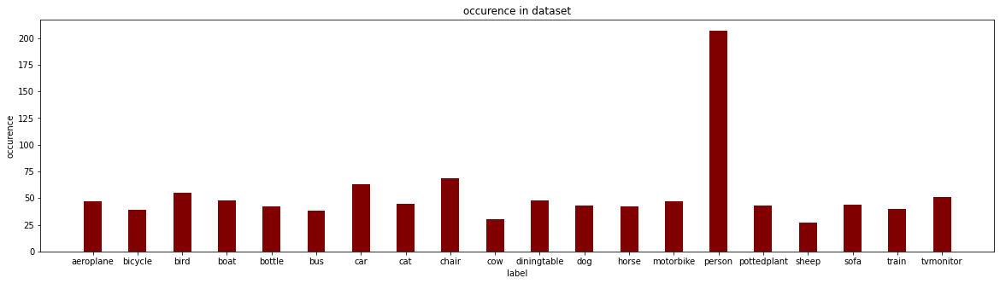

In [ ]:
#dict that countains each class name as key and occurence as value

dico = dict()
for label in train_df[labels]:
    dico[label] = train_df[label].value_counts()[1]
    
print(dico)
label = list(dico.keys())
count = list(dico.values())

#now we can plot the occurence per class
fig = plt.figure(figsize = (20, 5))
plt.bar(label, count, color ='maroon',
        width = 0.4)
 
plt.xlabel("label")
plt.ylabel("occurence")
plt.title("occurence in dataset")
plt.show()

As we can see, the data is **highly unbalanced** : the class **`person`** is overrepresented with regard to the other classes. If we train a classical model with this data as input, it is likely that it will be much more performant on recognizing the **person class** compared to the other ones. Using **`class weights`** will be important. Different implementations of class weights exist, but the basic idea is to increase the weight of the underrepresented classes and/or decrease the  weight of the overrepresented classes in the loss function. We will follow the implementation presented in [this stack exchage forum](https://datascience.stackexchange.com/questions/13490/how-to-set-class-weights-for-imbalanced-classes-in-keras).


In [ ]:
import math

def create_class_weight(labels_dict,mu=0.15):
    total = np.sum(list(labels_dict.values()))
    keys = labels_dict.keys()
    class_weight = dict()
    
    for key in keys:
        score = mu*total/float(labels_dict[key])
        class_weight[key] = score if score > 1.0 else 1.0
    
    return class_weight


class_weights = create_class_weight(dico)
class_weights

{'aeroplane': 3.408510638297872,
 'bicycle': 4.107692307692307,
 'bird': 2.9127272727272726,
 'boat': 3.3375,
 'bottle': 3.814285714285714,
 'bus': 4.21578947368421,
 'car': 2.5428571428571427,
 'cat': 3.5599999999999996,
 'chair': 2.3217391304347825,
 'cow': 5.34,
 'diningtable': 3.3375,
 'dog': 3.725581395348837,
 'horse': 3.814285714285714,
 'motorbike': 3.408510638297872,
 'person': 1.0,
 'pottedplant': 3.725581395348837,
 'sheep': 5.933333333333333,
 'sofa': 3.6409090909090907,
 'train': 4.005,
 'tvmonitor': 3.1411764705882352}

As we can see, the weight of the **person** class is kept to one, while the weights of all the **other classes are higher than one**. We can see that we give the highest weights to the **sheep** and the **cow** classes, which can be explained because these classes are the ones with the fewest samples. Let's create an array to store these class weights : 

In [ ]:
#create array of classweight : 
weights = np.empty((20,2), dtype="float32")
for index, key in enumerate(class_weights):
    weights[index] = [0.5,class_weights[key]]
weights

array([[0.5      , 3.4085107],
       [0.5      , 4.1076922],
       [0.5      , 2.9127274],
       [0.5      , 3.3375   ],
       [0.5      , 3.8142858],
       [0.5      , 4.2157893],
       [0.5      , 2.5428572],
       [0.5      , 3.56     ],
       [0.5      , 2.3217392],
       [0.5      , 5.34     ],
       [0.5      , 3.3375   ],
       [0.5      , 3.7255814],
       [0.5      , 3.8142858],
       [0.5      , 3.4085107],
       [0.5      , 1.       ],
       [0.5      , 3.7255814],
       [0.5      , 5.9333334],
       [0.5      , 3.6409092],
       [0.5      , 4.005    ],
       [0.5      , 3.1411765]], dtype=float32)

Now, we have to define a **`weighted loss`** : indeed, the idea of computing class weights is to use these weights **in the loss function** when training the model. In single label classification, the class weights can be simply given to the **model.fit** function. In multi-label cases, it is a bit more complicated : we will define a loss function, based on the **multi-label implementation** presented in [this stackoverflow discussion](https://stackoverflow.com/questions/48485870/multi-label-classification-with-class-weights-in-keras)

In [ ]:
from tensorflow.keras import backend as K

#based on answer in 
def get_weighted_loss(weights):
      def weighted_loss(y_true, y_pred):
        return K.mean((weights[:,0]**(1-y_true))*(weights[:,1]**(y_true))*K.binary_crossentropy(y_true, y_pred), axis=-1)
      return weighted_loss
loss = get_weighted_loss(weights)

### 2.2.2 Data preparation for classification

Now that we have dealt with the **class unbalance problem**, we can start to prepare the data in a form that will be compatible with **Tensorflow** models. First, let's drop the *'seg'* column from the data. Indeed, when doing classification, we will not need it. 

In [ ]:
data_train = train_df.drop(['seg'], axis=1)

Let's **divide into training and validation** sets: the training set will be used to train the classfier, while the validation set will be used to monitor the performance of the network while training to **avoid overfitting**. We will use a *Reduce Learning Rate on plateau* method that will reduce the learning rate when the validation loss is blocked on a plateau, to be able to reach a good enough local minima. We select a very small validation set because the number of training samples is small in comparison to the number of classes.

In [ ]:
from sklearn.model_selection import train_test_split  #split training and validation sets 

# split the data into train and test set
data_train, data_validation = train_test_split(data_train, test_size=0.05, random_state=42)

In [ ]:
print(data_train.shape, data_validation.shape)

(711, 21) (38, 21)


From the training and the validation dataset, let's extract the input (the RGB pixels values) and the output (the class values). 

In [ ]:
X_train = data_train["img"]
X_val = data_validation["img"]


y_train = data_train.drop(['img'], axis=1)
y_val = data_validation.drop(['img'], axis=1)
y_train = y_train.astype(float)
y_val = y_val.astype(float)

print(X_train.shape,X_val.shape, y_train.shape, y_val.shape)

(711,) (38,) (711, 20) (38, 20)


What we also need to do is to **resize and normalize the data**. Indeed, all images in the dataset needs to be coherent : same size and same pixel value range. We will resize the image to [224,224]

**<ins>Resize and normalize the images:</ins>**

In [ ]:
def resize_normalise(X,size=224):
  for i in range(0,len(X)):
    X.iloc[i] = np.array(tf.image.resize(X.iloc[i], [size,size]))
  X = np.stack(np.array(X), axis=0)

  #normalization of pixels value
  X = X/255

  return X

In [ ]:
X_train_normalized = resize_normalise(X_train)
X_val_normalized= resize_normalise(X_val)

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
#input shape for the model : will be in the form (column_width, row_width, number of channel)
input_shape = X_train_normalized.shape[1:4]
#output shape : will be the number of classes
output_shape = y_train.shape[1]

In [ ]:
print(input_shape,output_shape)

(224, 224, 3) 20


## 2.2. Classification Models from scratch


### 2.2.1. Random Classification Model
Before really kicking off with the image classification, we present the following `RandomClassificationModel` class:

In [ ]:
class RandomClassificationModel:
    """
    Random classification model: 
        - generates random labels for the inputs based on the class distribution observed during training
        - assumes an input can have multiple labels
    """
    def fit(self, X, y):
        """
        Adjusts the class ratio variable to the one observed in y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        y: list of arrays - n x (nb_classes)

        Returns
        -------
        self
        """
        self.distribution = np.mean(y, axis=0)
        print("Setting class distribution to:\n{}".format("\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        y_pred: list of arrays - n x (nb_classes)
        """
        np.random.seed(0)
        return [np.array([int(np.random.rand() < p) for p in self.distribution]) for _ in X]
    
    def __call__(self, X):
        return self.predict(X)

An instance of the class trained by finding the distribution of the given ground-truth whilst predictions are acquired by sampling labels from this distribution.

This classifier is very basic and should not be trusted to perform trusted predictions. 

It none-the-less forms a nice baseline, and a nice pattern on which our later classifiers will be based. 

```python
model = RandomClassificationModel()
model.fit(train_df["img"], train_df[labels])
test_df.loc[:, labels] = model.predict(test_df["img"])
test_df.head(1)
```

### 2.2.2. A simple CNN

Lets now try to make a **convolutional neural network** classifier to train on our data using the `tensorflow` package. We import the `Sequential` model and the following layers: `Conv2D` `Dropout`, `Dense`, `BatchNormalization`, `MaxPool2D` and `Flatten`, which we discussed before. The `ModelCheckPoint` will be used to save the weights of the trained classifier.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dropout, Dense, BatchNormalization, MaxPool2D, Flatten
from tensorflow.keras.callbacks import ModelCheckpoint

In the following class we now implement our classifier:

In [ ]:
check_cnn_from_scratch = ModelCheckpoint(filepath = 'cnn_from_scratch_wsh', #if the new model has a better validation_accuracy compared to the one at the previous epoch, the weight of the model are saved in checkpoint_cnn_best
                                          monitor='val_accuracy',           #at the end of the training, the best model will be in checkpoint_cnn_best
                                          save_best_only=True,
                                          save_weights_only=True,
                                          verbose=1)

class ClassifierFromScratch:
    def __init__(self, epochs=200, val_part=0.1):
        # define and compile the architecture
        model = Sequential([
            Conv2D(96, (11,11), strides=(4,4), activation='relu', padding="same", input_shape=(224,224,3)),
            BatchNormalization(),
            Conv2D(32, (2,2), activation='relu', padding="same"),
            BatchNormalization(),
            MaxPool2D((3,3), strides=(2,2)),
            Conv2D(64, (2,2), activation='relu', padding="same"),
            BatchNormalization(),
            Conv2D(15, (2,2), activation='relu', padding="same"),
            BatchNormalization(),
            MaxPool2D((2,2)),
            Flatten(),
            Dense(128, activation='relu'),
            Dropout(0.2),
            Dense(512, activation='relu'),
            Dense(20, activation='sigmoid')
        ])
        model.compile(optimizer='adam',
              loss=loss,
              metrics="accuracy")
        self.model = model
        self.epochs = epochs
        self.val_part = val_part

    def fit(self, X, y, val=None, training=0):
        if training == 0:
            self.model.load_weights("cnn_from_scratch_wsh")
            return self.model

        self.model.fit(
            X, 
            y, 
            epochs=self.epochs, 
            validation_split=self.val_part, # PROBLEMATIC?
            validation_data=val,
            verbose=2, callbacks=check_cnn_from_scratch)
        return self.model
        
    def predict(self, X):
        return self.model.predict(X)
    
    def __call__(self, X):
        return self.predict(X)


In the constructor we define the **architecture of our classifier**. It consists of 4 **convolutional layers** with batch normalization. We also use **max pooling**. At the end of the network, we have 3 **fully connected layers**. Note that in the last layer, we have **20 neurons** corresponding to the 20 classes and a **sigmoid activation** function for each of the neuron (the class can be present or not in the data).

The `fit` definition fits a dataset `X` and its corresponding labels `y`, thus training the model. The `predict` definition then uses this trained model to classify images.  

We ran the code offline via:

```python
CFS = ClassifierFromScratch(val_part=.5)
hist = CFS.fit(X_train_normalized,y_train, val=(X_val_normalized, y_val))
```

After which we can plot the results using:

```python
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('CNN from scratch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('CNN from scratch')
plt.ylabel('crossentropy loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
```

Giving the following result:


<div>
    <img src="https://drive.google.com/uc?export=view&id=1yfZ0B_RpvSxsQ9R8YGi9QqfZT1dSXUNU" style="width:100%">
    <img src="https://drive.google.com/uc?export=view&id=1yrLNx5judTr3CtZRmTFkrMPlZSddjSwK" style="width:100%">
</div>

These results are a bit underwelming: we can see that while the accuracy on the training set easily reaches ~0.8, the accuracy on the validation set does not. The loss on the validation set even fails to converge to a minimum. 

Despite the image weighting in the previous part, the dataset is too **small** to train a classifier from scratch which can **generalize well on unseen data**. 

The trained weights can be found [here](https://drive.google.com/uc?export=view&id=1JGYBbakVj0XMXCJmlCSKq54S4qif7Iqy) and were saved using the `check_cnn_from_scratch` callback.



Based solely on this we can already determine that our classifier is bad. The F1 score simply confirms this:

In [ ]:
from sklearn.metrics import f1_score

!unzip cnn_from_scratch.zip

CFS = ClassifierFromScratch(val_part=.5)
hist = CFS.fit(X_train_normalized,y_trainn, val=(X_val_normalized, y_val))

threshold = 0.5

y_pred = CFS.predict(X_val_normalized)
y_pred[y_pred>=threshold] = 1
y_pred[y_pred<threshold] = 0

print('f1-score: ', f1_score(y_val, y_pred, average = 'samples'))

## 2.3. Classification Models based on Transfer Learning 

We have seen that training a network from scratch does not give good results. The reason is that our **dataset is too small** to train a network from scratch. In those cases, **`Transfer Learning`** can be considered. Transfer learning is a technique where one model trained on a machine learning task can be *reused* for another task. Transfer learning has the ability to share learned features across different learning tasks and it has the advantage that *you don't need to train a full-scale model from scratch*. If we use a model that has been trained on an image classification tasks, with similar images compared to our dataset, it is **highly likely that the features to extract are quite similar**, which explains the power behind Transfer Learning. We will use a **`MobileNet`** architecture, pretrained on ImageNet, and we will fine tune it on our dataset. The advantage of this network is that it is quite small compared to other popular networks. It has been used **widely for multilabel image classification tasks**.

### 2.3.1. MobileNet

MobileNet is a convolution neural network known to be **`efficient and not very computationally costly`**. It combines depth-wise convolution and point-wise convolution, which reduces the number of convolution needed compared to standard convolution. An overview of the network is given below, from [a Medium Tutorial](https://medium.com/analytics-vidhya/image-classification-with-mobilenet-cc6fbb2cd470)

<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1sEdbWVjWmccg2wTVFaHznePYiaC3IGpu
", style="width: 450px;">
</p>


**<ins>Let's also define some callbacks function to call during the training : </ins>**
- **Reduce Learning Rate on Plateau** : if the validation loss does not decrease after "k" epochs, the learning rate is reduced. The idea behind this function is presented in the figure below. The idea is to reduce the learning rate in order to reach a good enough local minima (image from this [link](https://towardsdatascience.com/the-subtle-art-of-fixing-and-modifying-learning-rate-f1e22b537303)).
- **Early stopping** : If the validation loss does not decrease after "m" epochs, we stop the training : this can avoid that the training lasts forever.
- **Checkpoint** : It stores the weights of the network when the validation loss is minimal.

<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1nT1E6giI1TMENjsvFqWkIbJu5FFnbyea
", style="width: 150px;">
</p>

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Create 3 callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss',      #if validation_loss has not been reduced after 3 epochs, the learning rate is reduced to have a more "fine" learning
                              factor=0.5,
                              patience=3,
                              verbose=1)
early_stopping = EarlyStopping(monitor='val_accuracy',  #if the validation_accuracy does not get better after 6 epoch, the training is stopped
                               patience=30,
                               verbose=1)
checkpoint = ModelCheckpoint(filepath = 'model/checkpoint', #if the new model has a better validation_accuracy compared to the one at the previous epoch, the weight of the model are saved in checkpoint_cnn_best
                             monitor='val_accuracy',           #at the end of the training, the best model will be in checkpoint_cnn_best
                             save_best_only=True,
                             save_weights_only=True,
                             verbose=1)

Now, we can define the **class for the MobileNet classifier**. We will use a MobileNet which has been **pretrained on ImageNet**. We wil add a layer over the MobileNet architecture with *20 neurons* to perform our classification task (remember that we have 20 classes). **Important note : Each neuron in the output layer should have a sigmoid activation !** We are in a multilabel classification framework. Therefore, each label is present (value "1") or absent (value "0"). 

In [ ]:
#based on https://www.tensorflow.org/tutorials/images/transfer_learning

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense

class ClassifierMobileNet:
    def __init__(self, epochs=100):

        """
        Initialize the network, by compiling it

        Parameters
        ----------
        model: MobileNetV2
        """

        base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
        base_model.trainable = False


        model = Sequential([
          base_model,
          GlobalAveragePooling2D(),
          Dropout(0.5),
          Dense(20, activation='sigmoid')
        ])

        model.compile(optimizer='adam',
                      loss=loss,
                      metrics="accuracy")
        self.model = model
        self.epochs = epochs

    def fit(self, X, y, val, training=0):
        
        """
        Fit the network on input data X and labels y

        Parameters
        ----------
        X : input training data
        y : training labels
        val : tuple corresponding to validation data, in the 
        form val=(x_val,y_val)

        Return
        ----------
        The fitted model
        """

        if training == 0:
             self.model.load_weights("checkpoint_85")
        else:
            self.model.fit(X_train_normalized, y_train, epochs=self.epochs, verbose=1 ,
                           validation_data=val,callbacks=[reduce_lr,checkpoint])
        return self.model
        
    def predict(self, X):

        """
        Make prediction on X

        Parameters
        ----------

        Return
        ----------
        The predictions
        """


        threshold = 0.5
        y_pred = self.model.predict(X)
        y_pred[y_pred>=threshold] = 1
        y_pred[y_pred<threshold] = 0 
        return y_pred

    def __call__(self, X):
        return self.predict(X)

Let's now call our classifier and fit it on the data. If the argument **training** is equal to 0, a model which has already been trained and is stored on google drive will be loaded. If the argument **training** is equal to 1, the model will be trained for 100 epochs.

In [ ]:
ClassifierMobileNet = ClassifierMobileNet()
ClassifierMobileNet.fit(X_train_normalized, y_train,val=(X_val_normalized,y_val),training=0)

9420800/9406464 [==============================] - 0s 0us/step


The training performance is depicted in the figure below. We obtain around **85% accuracy for the training and around 75% for the validation accuracy**. But it is important to stress that we have a very small validation set which is not really representative of our generalization performance, which can be higher than that. 




<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1Ty4z__lFBpCUrEhLLn8-945wGhs7S64b
", style="width: 350px;">
</p>



**<ins> Metrics for multi label classification </ins>**

We have used accuracy to see if our model performs well. Accuracy is the proportion of correct predictions (true positive and negative) over the total amount of predictions. The formula is presented in the figure below, from a [Medium tutorial](https://medium.com/analytics-vidhya/confusion-matrix-accuracy-precision-recall-f1-score-ade299cf63cd) 

<p align="center">
  <img width="200" src="https://cdn-images-1.medium.com/max/800/1*R6jP_uvlkcxtQSa264N3Sw.png"">
</p> 


In a multi label framework with 20 classes, we will compare two vectors of size 20. In general, many of the classes will have the value "0", which will results in a **high accuracy even if the prediction is not good enough** ! Therefore, we need to find a metric that penalizes more the False Negative. 

**`F1 score`**


As we have seen earlier, **F1-score** is a metric that **combine precision and recall**. F1-score is a harmonic mean of precision and recall : **both of them needs to be high** to have a high F1-Score. 

<p align="center">
  <img width="200" src="https://cdn-images-1.medium.com/max/800/0*tu5x_GEgs-iRpJ9H">
</p> 

Let's see how our model perform in terms of F1-score on the validation set

In [ ]:
from sklearn.metrics import f1_score

predictions = ClassifierMobileNet.predict(X_val_normalized)
predictions_train = ClassifierMobileNet.predict(X_train_normalized)

print('f1-score on val: ', f1_score(y_val, predictions, average = 'samples'))
print('f1-score on train: ', f1_score(y_train, predictions_train, average = 'samples'))


f1-score on val:  1.0
f1-score on train:  0.990436005625879


We can see that the F1-score for the training and the F1-score for the validation are pretty close. This means that our model **perfoms well and does not overfit**. 

## 2.4. Prediction on the test set

Now, finally, we can perform *prediction on the test set*.

In [ ]:
data_test = test_df.drop(['seg'], axis=1)
X_test = data_test["img"]

X_test_normalized = resize_normalise(X_test)
y_test_pred = ClassifierMobileNet.predict(X_test_normalized)

test_df.loc[:, labels] = y_test_pred
test_df.head(1)

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


### 2.4.1. Visualization of some prediction on the test set 
Let's also **visualize** some prediction, and see how the network **perform on each of the classes**.

In [ ]:
def get_predicted_class(prediction):
    predicted_class = []
    for i in range(0,len(prediction)-1):
        if int(prediction[i]) == 1:
            predicted_class.append(classes[i])
    return predicted_class
            

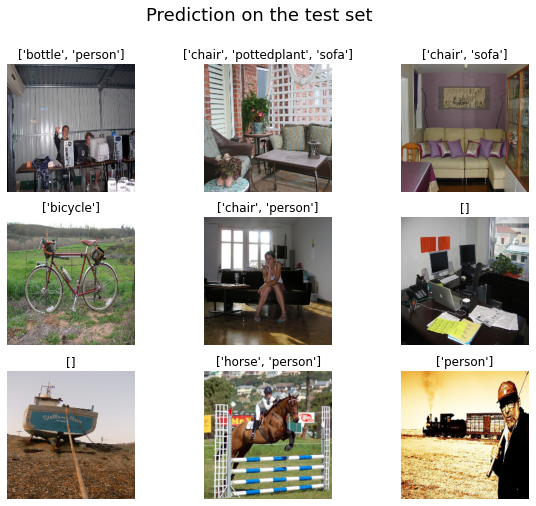

In [ ]:
classes = ['aeroplane','bicycle','bird','boat','bottle','bus','car','cat','chair','cow','diningtable','dog','horse',
           'motorbike','person','pottedplant','sheep','sofa','train','tvmonitor']

fig=plt.figure(figsize=(10, 8))

columns = 3
rows = 3

for i in range(columns * rows):

    img = X_test_normalized[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.suptitle("Prediction on the test set",fontsize = 18)
    plt.title(get_predicted_class(y_test_pred[i]))
    plt.axis('off')
    
plt.show()

**<ins>How does the network perform on each class</ins>**

In [ ]:
from sklearn.metrics import classification_report

predictions_train = ClassifierMobileNet.predict(X_train_normalized)
report = classification_report(y_train, predictions_train,target_names=classes)

print(report)

              precision    recall  f1-score   support

   aeroplane       1.00      1.00      1.00        43
     bicycle       1.00      1.00      1.00        36
        bird       1.00      1.00      1.00        53
        boat       1.00      1.00      1.00        46
      bottle       1.00      1.00      1.00        40
         bus       1.00      1.00      1.00        35
         car       0.98      1.00      0.99        59
         cat       1.00      1.00      1.00        44
       chair       0.94      1.00      0.97        62
         cow       0.91      1.00      0.95        29
 diningtable       1.00      1.00      1.00        47
         dog       0.95      1.00      0.98        41
       horse       1.00      1.00      1.00        41
   motorbike       1.00      1.00      1.00        43
      person       0.99      0.97      0.98       195
 pottedplant       0.95      1.00      0.98        41
       sheep       1.00      1.00      1.00        26
        sofa       0.95    

We can see that the performance between the different class is similar, which proves that we were able **to deal with the data unbalance problem**.

# 3. Semantic segmentation

## 3.1. Introduction
In this section, multiple models are evaluated for performing **image segmentation** on the subset of PASCAL VOC dataset. Thus, the following topics are covered:
1. What is image segmentation?
2. Why is Image segmentation important? And its applications?
3. How does image segmentation Work?
4. Image segmentation using Deep learning techniques
5. Loss functions for our problem 
6. Evaluation metrics
7. Multilabel segmentation


In the previous part, we tried to assign 1 or more labels to the entire image. The goal of image segmentation is similar, but instead of assigning the labels to the entire image, we assign a **label to every pixel**. Image segmentation tasks can be classified into three groups: instance, semantic and panoptic segmentation. The **instance** segmentation provides a segment map for each object present in the image without knowing which class the object belongs to. The **semantic** segmentation segments out a broad boundary of objects belonging to the same class. While **panoptic** segmentation is the most informative since it gives the segment maps of all the objects of any particular class in the image. The differences are clearly shown in the figure which are from [v7labs](https://www.v7labs.com/blog/image-segmentation-guide). In this assignment, we focus on the semantic segmentation. 
<p align="center" >
  <img width="400" src="https://drive.google.com/uc?export=view&id=1sx7hoAg3MMjJrNDCV2XCN34hSWQoTHU6">
</p>
<p align="center">Different types of image segmentation</p> 

Many segmentation techniques started in a medical or biological context. Automatical detection of e.g. cell type can help doctors with detecting cancer in patients or can make lengthy diagnostic tests trivial. Another big branch is autonomous vehicles. Cars need to be able to distinguish the road marks from a zebra crossing, have to detect traffic lights. Detection of humans and other living creatures is essential in preventing accidents. But image segmentation can be found in many other places such as handwriting detection or virtual backgrounds during a video call.

<p align="center" >
  <img width="400" src="https://drive.google.com/uc?export=view&id=1V6g5SEE1VhjlrYigvAIotfNwlcuR1-Un">
</p>
<p align="center">Self-driving car detecting the road, other cars, people, traffic lights... using image segmentation</p> 


Simple segmentation tasks, such as detecting letters on a sheet of paper, can be done using **classical techniques**. These classical techniques include for example morphological operations like we had to apply in the first individual assignment. But once the task involves multiple completely different objects, different points of view and/or big difference between members of the same class (think dog breeds), these classical operations will fail.

But just as pretty much every other problem computer scientists could not solve by using clever algorithms and classical techniques, they have tried **deep learning** with great succes. At first, fully convolutional neural nets were used. The downside of a fully CNN is that the image size is reduced after every convolution so the segmentation map has a much lower resolution than the original image.

To counteract this problem, one could simply interpolate the low resolution segmentation map. But we could also use another neural network for this task. This time the neural network consists of up-convolutions. The entire model looks looks **symmetrical**, with the enocder part consisting of convolutions and the decoder of up-convolutions. The decoder realizes a non-linear interpolation, increasing resolution and accuracy of the segmentation. The UNet build further on this architecture.



### 3.1.1. Visualization 
In this section, a class for **visualizing the ground truth and the predictions** is defined. As previously mentionated the PASCAL VOC dataset comprises 20 classes and one additional class corresponding to the background. Therefore, a **color of each class** has been defined according to the literature. The next cell defines a class for defining these colors and methods for a more intuitive visualization. 

In [ ]:
class VisualizationSegmenation:
    """
    Class aimed to visualize the images, labels, and predictions of the segmentation model.
    The labels and predictions are colored according to the PASCAL VOC format.
    """
    def __init__(self, labels):
        """
        Initializer for setting the labels of the classes

        Parameters
        ----------
        main_dir: directory of the main dataset
        images_dir: direcoty containing the RGB images
        mask_dir: directory containing the corresponding maks
        """
        self.labels = labels
        self.cmap = self.color_map()

    def color_map(self, N=256, normalized=False):
        """
        Generates the color code for the PASCAL VOC

        Parameters
        ----------
        N: number of classes
        Returns
        -------
        cmap: list of color codes
        """
        def bitget(byteval, idx):
            return ((byteval & (1 << idx)) != 0)
        cmap = np.zeros((N, 3), dtype='uint8')
        for i in range(N):
            r = g = b = 0
            c = i
            for j in range(8):
                r = r | (bitget(c, 0) << 7-j)
                g = g | (bitget(c, 1) << 7-j)
                b = b | (bitget(c, 2) << 7-j)
                c = c >> 3
            cmap[i] = np.array([r, g, b])
        cmap = cmap/255 if normalized else cmap
        return cmap

    def color_map_viz(self):
        """
        Aimed to create a visualization fo the color code. 
        Plots a figure with the colos along the names of the classes
        """
        nclasses = 21
        row_size = 100
        col_size = 500
        plt.figure(figsize=(5,10))
        cmap = self.color_map()
        array = np.empty((row_size*(nclasses+1), col_size, cmap.shape[1]), dtype=cmap.dtype)
        print(array.shape)
        for i in range(nclasses):
            array[i*row_size:i*row_size+row_size, :] = cmap[i]
        array[nclasses*row_size:nclasses*row_size+row_size, :] = cmap[-1]
        plt.imshow(array)
        plt.yticks([row_size*i+row_size/2 for i in range(nclasses+1)], labels)
        plt.xticks([])
        plt.show()

    def get_color_map(self, image, mask):
        """
        Given a image name and its mask, it colors the mask acording to the color code and overlaps it with the RGB image
        ----------
        image: tf.array correspoinding to the image
        mask; tf.array correspoinding to the mask
        Returns
        -------
        overlap: overlaping of RGB and colored mask
        """
        if tf.is_tensor(sample_image):
            npmask = np.squeeze(mask.numpy())
            img = np.uint8(255*image.numpy())
        else:
            npmask = mask
            img = image
        npmask = np.round(npmask).astype('uint8')
        h,w = npmask.shape

        colored = np.zeros((h, w, 3), dtype='uint8')
        for i in range(21):
            colored[npmask==i] = self.cmap[i]

        overlap = cv2.addWeighted(img, 0.35, colored, 0.65, 0)
        return overlap

    def display(self, display_list, labels=None):
        """
        Given a list of arrays, it plots them toggether
        ----------
        display_list: list of arrays (tf or np)
        Returns
        """
        plt.figure(figsize=(len(display_list)*5, 5))
        plt.subplots_adjust(hspace=0.02, wspace=0.02)
        if labels is None:
            title = ['Input Image', 'True Mask', 'Predicted Mask']
        else:
            title = labels
        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])
            if i==1:
                image = self.get_color_map(display_list[0], display_list[1])
            elif i==2:
                image = self.get_color_map(display_list[0], display_list[2])            
            else:
                image = display_list[i]
            plt.imshow(image)  
            plt.axis('off')
        plt.show()

Having the visualization class defined, let's create an object and define the classes labels to define a color for each class.

(2200, 500, 3)


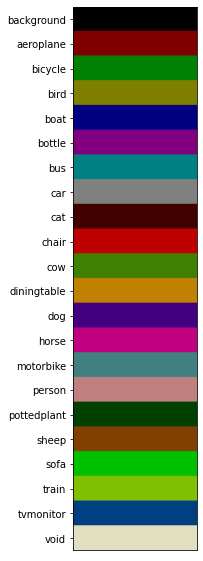

In [ ]:
labels = ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor', 'void']
visSeg = VisualizationSegmenation(labels)
visSeg.color_map_viz()


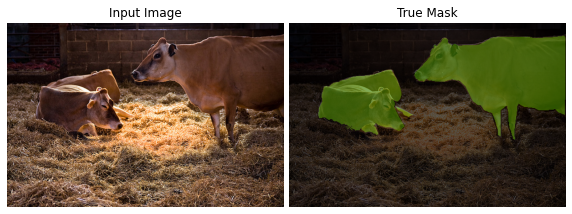

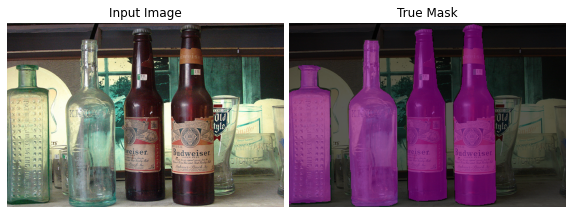

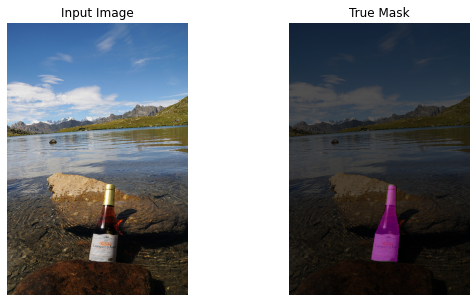

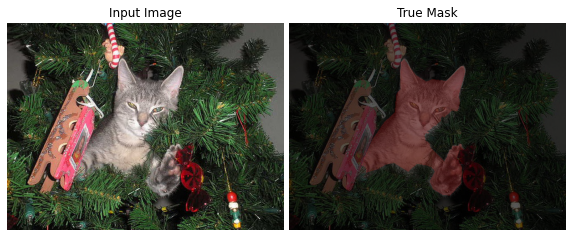

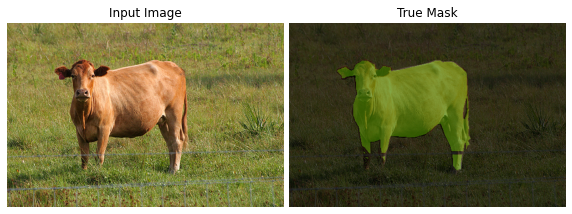

In [ ]:
max = 3
for i,(sample_image, sample_mask) in enumerate(zip(train_df['img'],train_df['seg'])):
    visSeg.display([sample_image, sample_mask])
    if i>max:
        break

## 3.2. Segmentation from scratch

###3.2.1 Model selection   
We choose to train a model with an analogous **U-net architecture** to do semantic segmentation from **scratch**.The first reason is due to fact that the initial train-validation dataset **only** contains 749 samples. Thus, it is not feasible to train a complicated model. Second, the U-Net architecture has its ability to yield relatively good results on pixel labelling tasks with limited dataset images. However, the original U-net model still has **too many parameters** to train on our small dataset, thus, we build a **simplified** U-net model with fewer parameters to train while keep the overall architecture. 

Our proposed simplified Unet model is shown in the Figure below. The architecture has a 'U' shape and it contains **two paths**.The first contracting path has 4 blocks of two times convolution layers using ReLU activations and batch normaliztion. MaxPooling layers (2x2) are applied 4 times after each block. The contracting path is used to capture the context of the image. The second symmetric expanding path is a process of increasing the height and width and reducing the depth of images to reobtain our original image size. What differentiates a Unet from an encoder-decoder network is the presence of skip connections. These connection concatenate the layers of the encoder and decoder with the same dimensionality. On the one hand, skip connections can ensure the reusability of features from the earlier layers and prevent information loss. On the another hand, skip connections can achieve an uninterrrupted gradient flow from the first layer to the last layer which tackles the vanishing gradient problem.The 1x1 convolution operation is used for the output layer to get a semantic map with 21 classes (20 classes + background) and the softmax is used as the activation function. 
<p align="center" >
  <img width="900" src="https://drive.google.com/uc?export=view&id=18ww8Z66YH2ISpaJVfdBRHzxSurCGfPmt">
</p>
<p align="center">Simplfied U-net architecture</p> 






### 3.2.2 Data preparation
In order to train the simplified Unet model, some preprocessing steps on the initial dataset are necessary. 

1.The images were resized to have the same size with square shape since most of the neural network models assume a square shape input image. 

2.The normalization was applied to ensure each input parameter has a similar data distribution. This made convergence faster while training the network.

3.The `tf.data.Dataset` class was used to define the training and validation datasets. It can perform shuffling and batching of samples efficiently and cache and prefetch the data easily.

In [ ]:
def normalize(image):
    image = tf.cast(image, tf.float32) / 255.0
    return image

def resize(image, height, width):
    image = tf.image.resize(image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return image

def tf_dataset(x,y,batch=15):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.batch(batch)
    dataset = dataset.repeat()
    dataset = dataset.prefetch(2)
    return dataset

In [ ]:
# Prepare training, validation dataset 
img_g,img_m=[],[]
for img,seg in zip(train_df['img'],train_df['seg']):
    img=resize(img,224,224)
    img=normalize(img)
    img_g.append(img)
    seg= np.expand_dims(seg, axis=-1)
    seg=resize(seg,224,224)
    img_m.append(seg)
img_g=np.array(img_g)
img_m=np.array(img_m)
train_imgs,valid_imgs,train_masks,valid_masks=train_test_split(img_g, img_m, test_size=0.2, random_state=42)
train_dataset = tf_dataset(train_imgs, train_masks,batch=15)
valid_dataset = tf_dataset(valid_imgs, valid_masks, batch=15)

### 3.2.3 Simplified U-Net modelling 
The modelling processing contains mainly 3 steps:
- Model construction
- Model fit
- Model prediction

#### 3.2.3.1 Model construction 
The first step is to **define the simplified Unet model**. The simplified Unet model contains 4 convolution blocks in the encoder and corresponding has 4 times upsampling and skip connection. Originally we used sparse categorical cross entropy as our loss function. This loss function is built into keras via `tf.keras.losses.SparseCategoricalCrossEntropy` and is popular for image segmentation purposes. However, as can be seen below, the neural network labels everything as background. 

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=113-_hBjxMa4VrE8psszTDEmWFzC7v8X1">
</p>
<p align="center">The initial trial with sparse categorical cross entropy</p> 


If we take a look at the number of pixels from every class and compare them to the number of background pixels as shown below, the problem becomes clear. The number of **background** pixels is orders of magnitude **higher** than any other class.

<p align="center" >
  <img width="500" src="https://drive.google.com/uc?export=view&id=1UL5sgCGZTaPGAEXP5G7AN3Iu115xE9vO">
</p>
<p align="center">The number of pixels from each class</p> 

To counteract this, we can add weights to each of the labels. Unfortunately, `tf.keras.losses.CategoricalCrossEntropy` does not support adding weights directely to the loss. Instead **we need to add an aditional layer to the input of the neural net with the weights**. 

Additionally, **we used Focal Loss, which is a loss function designed to deal with class imbalance** better than categorical cross entropy: focal loss.Focal loss was introduced by Lin et al. in 2018 to improve object detectors where there is an extreme imbalance in background and foreground classes. This loss adds a modulating factor to the cross-entropy loss to **reduces the influence of easy examples** (background in our case) on the loss function, resulting in more attention being paid to hard examples(other classes). Another advantage of focal loss is that weights can be directly added to each label. Thus, we used focal loss and weights for each class. Focal loss is not included in the `tf.keras.losses` functions, but needs to be [installed first via pip](https://focal-loss.readthedocs.io/en/latest/)





#### 3.2.3.2 Model fit and evaluation
We have **trained** the simplified Unet model according to the hyperparameters which are indicated in the code below, and we also provide the option to train the model on your own. As you can observe from the graph of training and validation losses, both **training and validation losses first decrease and stay constant**. And the validation loss is always lower than the training loss indicating there is no overfitting issue. As for training and validation accuracies, the figure clearly states that the both accuracies are around 0.7 and the validation accuracy is only **slightly** lower than the training accuracy.
<p align="center" >
  <img width="500" src="https://drive.google.com/uc?export=view&id=1OF6PHekEi1sVE_4SPZxGOOmEoQ7UG54i">
</p>
<p align="center">Training and validation losses for 150 epochs</p> 
<p align="center" >
  <img width="500" src="https://drive.google.com/uc?export=view&id=1_KdrYNGndPo2HhKMP5j7uGz5uLV4Snfm">
</p>
<p align="center">Training and validation accuracies for 150 epochs</p> 

Just as with image classification, there exist **multiple evaluation metrics** for segmentations as well. We discuss three metrics with their pros and cons


*   Accuracy
*   Dice score / F1 score
*   Intersect over union / IoU / Jaccard index


**Accuracy** is simply the frequency of how often the prediction matches the actual label and is calculated on a pixel per pixel basis. In a binary classification setting, accuracy is equivalent to the True Positive Rate. The biggest advantage of accuracy is its interpretability, but care must be taken when classes are highly imbalanced. In the case where the segmentation only predicted background, the accuracy still reached 80%, since that is the fraction of background pixels. Accuracy is calculated with tensorflow using the `tf.keras.metrics.accuracy` function

The problem of imbalance can be solved with the **Dice coefficient**, better known as the **F1 score**. It is calculated as $F_1 = \frac{2TP}{2TP + FP + FN}$ in a binary setting. In our multi-classification setting, it can be calculated by considering every label against all others, calculating the F1 score and averaging. Consider again the case where the net only predicts background. No true postives will be present for other classes besides background and the score will be lower than accuracy. No tensorflow implementation of the Dice score exist directly, but it can still be easily calculated.

Finaly there is also the **intersect over union (IoU)**. This is the ratio of the overlap of 2 distributions divided by its union. In a binary setting, it is calculated as $IoU = \frac{TP}{TP+FP+FN}$. We can calculate IoU in tensorflow with the function `tf.keras.metrics.IoU`. The multiclass case is calculated as with the Dice score. IoU and Dice score are very similar and are related via $F_1 = \frac{2IoU}{1+IoU}$ (and this is the reason the Dice score is not a metric in tensorflow). The main difference is their 'strictness'. IoU tends to penalize a single bad outlier more than the F1 score. If for example segmentation A performs better than segmentation B on the main object, but classifies some random pixels somewhere else in the image not as background, IoU will prefer segmentation B but F1 score will prefer classifier A.

<p align="center" >
  <img width="400" src="https://drive.google.com/uc?export=view&id=1typvfSkfOfaR6emfcMgWJ3NqyAB05214">
</p>
<p align="center">Visual clarification of IoU</p> 


Because of the problem outlined with Dice score and IoU, along with them being harder to interpret, **accuracy is chosen as the evaluation metric of choice**. **Constant visual inspection** is done on the segmentation masks, so the problem where the majority class overwhelms the other classes will also be spotted.

#### 3.2.3.3 Model prediction 
By using the trained model, we can predict masks for the test dataset and store these masks in the dataframe. As you can see some examples of predictions below, the model seems to predict the location of the class well when the **color difference** between the background and the object is quite large. However, the model cannot further predict the **details** of the object. 
<p align="center" >
  <img width="400" src="https://drive.google.com/uc?export=view&id=1rCCBAicG7iTT5buurKak0T3tfNklclJn">
</p>
<p align="center">Some examples of relatively good predictions</p> 

Moreover, the trained model does not perform well when **certain cases** occur as shown in the figure below. When the color difference between the background and object is not large enough, the model failed to predict the object. When there are multiple objects, the model cannot segment all objects from the background. When the object is too small compared to the background, the model totally ignored the object. 

<p align="center" >
  <img width="400" src="https://drive.google.com/uc?export=view&id=1jXv-jV1QBpKIypYq_w_yRlLT0nCDwWnD">
</p>
<p align="center">Some examples of bad predictions</p> 



Now, lets define the **segmentation model from scratch**. As previously mentioned, we adopted the U-Net architecture.

In [ ]:
class Simplifed_Unet:
    #construct a simplified Unet model
    
    def build_unet(self,shape, num_classes,weights):
        """ Construct a simplified Unet model using convolution blocks, upsampling and skip connection.

        Parameters
          ----------
          shape: tulpe
              Determine the shape of the input data 
          num_classes: interger
              Determine the number of segmented classes
          weights: list
              Determine the weights for each class  
        Returns
          ----------
          model: a compiled model 

        """ 
        def conv_block(inputs, filters, pool=True):
            x = Conv2D(filters, 3, padding="same")(inputs)
            x = BatchNormalization()(x)
            x = Activation("relu")(x)

            x = Conv2D(filters, 3, padding="same")(x)
            x = BatchNormalization()(x)
            x = Activation("relu")(x)

            if pool == True:
                p = MaxPool2D((2, 2))(x)
                return x, p
            else:
                return x

        #Encoder
        inputs = Input(shape)
        x1, p1 = conv_block(inputs, 16, pool=True)
        x2, p2 = conv_block(p1, 32, pool=True)
        x3, p3 = conv_block(p2, 48, pool=True)
        x4, p4 = conv_block(p3, 64, pool=True)

        #Bridge
        b1 = conv_block(p4, 128, pool=False)

        #Decoder
        u1 = UpSampling2D((2, 2), interpolation="bilinear")(b1)
        c1 = Concatenate()([u1, x4])
        x5 = conv_block(c1, 64, pool=False)

        u2 = UpSampling2D((2, 2), interpolation="bilinear")(x5)
        c2 = Concatenate()([u2, x3])
        x6 = conv_block(c2, 48, pool=False)

        u3 = UpSampling2D((2, 2), interpolation="bilinear")(x6)
        c3 = Concatenate()([u3, x2])
        x7 = conv_block(c3, 32, pool=False)

        u4 = UpSampling2D((2, 2), interpolation="bilinear")(x7)
        c4 = Concatenate()([u4, x1])
        x8 = conv_block(c4, 16, pool=False)

        #Output layer
        output = Conv2D(num_classes, 1, padding="same", activation="softmax")(x8)
        model=Model(inputs, output)

        #copile model with Focal loss function for multiclass classification with integer labels.
        model.compile(optimizer='adam',
                  loss=SparseCategoricalFocalLoss(gamma=2, class_weight=weights, from_logits=True),
                  metrics=['accuracy'])
        return model 
    
    def fit(self,train_imgs, train_masks,valid_imgs, valid_masks, model,train_model=False):
        '''Train the model or load the model has been trained for 150 epochs

        Parameters
            ----------
            train_img: numpy array
                     The training dataset 
            train_masks: numpy array 
                     The labels of the training dataset
            valid_imgs: numpy array 
                     The validation dataset 
            valid_masks:numpy array
                    The labels of the validation dataset
            model: a compiled model     
            train_model: boolean
                    Determine if train the model or load the trained model 

        Returns
         -------
           trained model  
        '''
                
        if train_model:
          #Hyperparameters
          lr=1e-4
          epochs=150
          batch_size=15

          #training and test dataset 
          train_dataset = tf_dataset(train_imgs, train_masks,batch=batch_size)
          valid_dataset = tf_dataset(valid_imgs, valid_masks, batch=batch_size)
          
          #fit the model 
          train_steps = len(train_imgs)//batch_size
          valid_steps = len(valid_imgs)//batch_size

          reduce_lr=ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-6)

          r=model.fit(train_dataset,
          steps_per_epoch=train_steps,
          validation_data=valid_dataset,
          validation_steps=valid_steps,
          epochs=epochs,
          callbacks=[reduce_lr])

          # plot the training and validation losses
          plt.plot(r.history['loss'], label='train loss')
          plt.plot(r.history['val_loss'], label='val loss')
          plt.legend()
          plt.show()
          #plt.savefig('LossVal_loss')

          # plot the training and validation accuracies
          plt.plot(r.history['accuracy'], label='train accuracy')
          plt.plot(r.history['val_accuracy'], label='val accuracy')
          plt.legend()
          plt.show()
          #plt.savefig('AccVal_acc')
          model.save('./unet_weighted.h5')
          trained_model=tf.keras.models.load_model('./unet_weighted.h5')
        else:
          trained_model=tf.keras.models.load_model('./unet_weighted_focalloss.h5')
        return trained_model
    
    def predict(self,test_df,trained_model):
        '''Predict labels for the test dataset

        Parameters
            ----------
            test_df: numpy array 
                     The test images 
            model: The trained model 

        Returns
         -------
           test_mask: the predicted masks stored in a column of the dataframe  
        '''
        mask=[]
        for img in test_df['img']:
            (h,w,_) =img.shape
            img=tf.image.resize(img, [224,224], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
            img=tf.cast(img, tf.float32) / 255.0
            img=np.expand_dims(img,axis=0)
            pre_mask=trained_model.predict(img)
            pre_mask=tf.math.argmax(pre_mask,axis=-1)
            pre_mask=pre_mask[..., tf.newaxis]
            pre_mask=tf.image.resize(pre_mask, [h, w], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
            pre_mask=pre_mask.numpy()
            pre_mask=np.squeeze(pre_mask)
            mask.append(pre_mask.tolist())
        test_mask=pd.DataFrame({'pre_mask':mask})
        return test_mask 

After having defined the class for constructing the model, we will create a model an load weights we have obtained offline by training the model, since the training process can take a while depending on the computational resources. Then, some predictions are performed for the test set and stored in the `test_df` dataframe.

In [ ]:
model = Simplifed_Unet()
unet = model.build_unet((224, 224, 3), 21, [1, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10])
#unet.summary()
trained_model = model.fit(train_imgs, train_masks,valid_imgs, valid_masks,unet,train_model=False)
pre_mask=model.predict(test_df,trained_model)
test_df['seg'] = pre_mask

Next, lets plot some **results of the prediction** using the scratch model

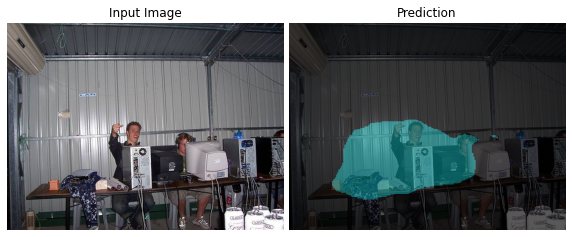

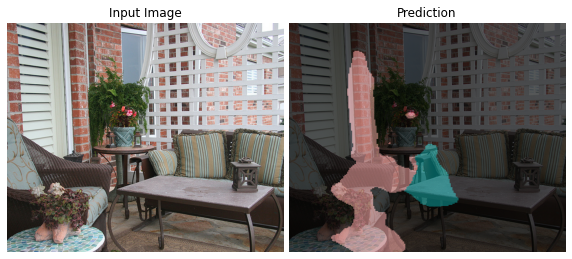

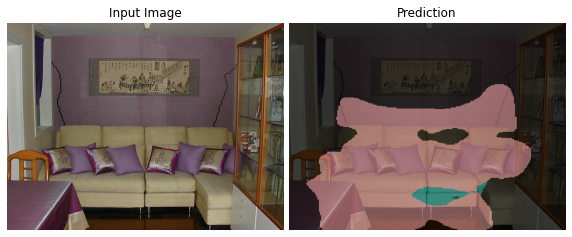

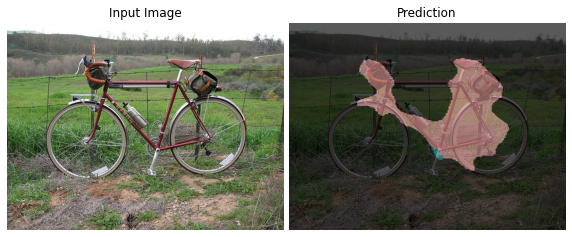

In [ ]:
max = 2
for i,(sample_image, sample_mask) in enumerate(zip(test_df['img'],test_df['seg'])):
    visSeg.display([sample_image, sample_mask], ['Input Image', 'Prediction'])
    if i>max:
        break

As it can be seen this vanilla model is unable to correctly predict the segmentation mask of the diferent objects. We observe that it is able to find the location of the main object in the scene but the segmentation mask does not fit to the boundaries of the objects and neither the class. We can argue this poor performance to:
- **The reduced train set**. Because the subset we are working with is quite small compared with the original dataset, the model can not generalize the underlying information
- **Reduced capacity of the model**. Since we are using a reduced model of `500K` parameters, it is not able to fit the training data thus, it suffers from *underfitting* as it was shown in the learning curves.
- **Training scheme**. Usually, when facing problems with small dataset, the common aproach is to use tranfer learning to help the learning and generalization of the information. However, for shake of demonstration, here we trained the model from scratch. In the next section a more sophisticated solution is proposed.

## 3.3. Segmentation using Transfer Learning
Based on the findings from the previous section. Here, we implement a more sophisticated solution using techniques designed to tackle the underlying challenges of our problem. Overall:
- A preprocessing stage is added to increase the initial training set.
- A more complex model with more parameters is proposed.
- As part of the solution **Transfer Learning** is used for helping to the generalization.

In the following sections, each of these contributions is further detailed.

### 3.3.1 Preprocessing

The performance of Machine learning and Deep learning models in particular depends on the quality, **quantity** and relevancy of the training data. However, *insufficient data is one of the challenges for this problem* since the initial dataset comprises just 749 samples of images and their corresponding masks. Therefore, a preprocesing stage to enlarge the number of samples in the initial data is appealing. Nevertheless, this has to be performed carefully since in segmentation mask the relationship between the input-output is pixel-wise; thus, all geometric modifications to the input should also be applied to the mask.

For our segmentation problem, as first the following operations were performed to **increase the initial dataset**:
1. The four corners of the original size image & mask were cropped, as shown in the left in the figure bellow. By applying this step, four samples of images-masks were generated.
2. The samples were resized and two sides of the image cropped. By applying this step, two additional images were obtained. Specifically:
 - The image along with the mask were resized, to the closest shape.
 - For horizontal images, the left and right side areas of the image and mask were cropped, see middle plot of figure below.
 - For vertial images, the top and bottom areas of the image and mask were cropped
3. The original samples were resized to a fixed size modifying the ratio of the height & width. 

<p align="center" >
  <img width="900" src="https://drive.google.com/uc?export=view&id=16pONgq9-Rv-iUZQ82crMbg4_dwknzyTA">
</p>
<p align="center">Preprocessing in the training set</p> 

By applying this stage, the original size of the initial dataset was extended **from 749 to 5243 pairs of samples**, which helped to improve the generalization on the segmentation models. This was verified by experimentation. In the next secction, a class for performing this preprocessing is defined.

In [ ]:
class PreprocessingSegmentation:
    """
    Preprocessing segmentation model: 
        - Given an initial dataset, this class preprocess the images and saves the images and labels in two directories
            - imgs/ contains the RGB images
            - mask/ contains the corresponding masks
        - Additionally, images are cropped in a deterministic way:
            - Four corners
            - Two sides (left and right or top and bottom)
            - Original image is also saved
        - The original size of dataset is enlarged 6xtimes
    """
    def __init__(self, main_dir, images_dir, mask_dir):
        self.inpath  = os.path.join(main_dir, images_dir)
        self.outpath  = os.path.join(main_dir, mask_dir)
        self.create_dir([self.inpath, self.outpath])

    def create_dir(self, paths):
        """
        Creates a set of directories defined by the list of paths
        Parameters
        ----------
        paths: list directorie names

        Returns
        -------
        self
        """
        for dir_path in paths:
            if not os.path.exists(dir_path):
                os.makedirs(dir_path)
            else:
                print(f'{dir_path} already there')
        return self

    def get_corners(self, image, size):
        """
        Given an image, returns crops of the four corners
        
        Parameters
        ----------
        image: array to process
        size: size of the croped regions
        Returns
        -------
        TLeft: Top left crop
        TRight: Top right crop
        BLeft: Bottom left crop
        BRight: Bottom right crop
        """
        TLeft = image[:size,:size]
        TRight = image[:size,-size:]
        BLeft = image[-size:,:size]
        BRight = image[-size:,-size:]
        return [TLeft, TRight, BLeft, BRight]

    def get_sides(self, image, size):
        """
        Given an image and the expected size, it resizes to the closest ratio and crops the two extremes
        
        Parameters
        ----------
        image: array to process
        size: size of the croped regions
        Returns
        -------
        p1: part one (top or left region)
        p2: part two (bottom or right region)
        """
        h, w = image.shape[:2]
        ratio = w/h
        if ratio>1:
            resized = cv2.resize(image.copy(), (0,0), fx=size/h, fy=size/h)
            p1 = resized[:,:size]
            p2 = resized[:,-size:]
        else:
            resized = cv2.resize(image.copy(), (0,0), fx=size/w, fy=size/w)
            p1 = resized[:size,:]
            p2 = resized[-size:,:]
        return [p1, p2]

    def process(self, train_df, size):
        """
        Performs the preprocessing getting the corners, left and right side, and resizing the image.
        Saves all the results in the 
        
        Parameters
        ----------
        train_df: datagrame
        size: size of the cropped images
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        count = 0
        for i in range(len(train_df)):
            print(f'Processing {i+1}/{len(train_df)} sample', end='\r')
            image = train_df.iloc[i]['img'][:,:,::-1]
            mask  = train_df.iloc[i]['seg']
            cv2.imwrite(os.path.join(self.inpath, f'{str(count).zfill(5)}.png'), image)
            cv2.imwrite(os.path.join(self.outpath, f'{str(count).zfill(5)}.png'), mask)
            count +=1

            image_corners = self.get_corners(image, size)
            mask_corners = self.get_corners(mask, size)
            for roi_image, roi_mask in zip(image_corners, mask_corners):
                cv2.imwrite(os.path.join(self.inpath, f'{str(count).zfill(5)}.png'), roi_image)
                cv2.imwrite(os.path.join(self.outpath, f'{str(count).zfill(5)}.png'), roi_mask)
                count +=1
            image_parts = self.get_sides(image, size)  
            mask_parts = self.get_sides(mask, size)
            for roi_image, roi_mask in zip(image_parts, mask_parts):
                cv2.imwrite(os.path.join(self.inpath, f'{str(count).zfill(5)}.png'), roi_image)
                cv2.imwrite(os.path.join(self.outpath, f'{str(count).zfill(5)}.png'), roi_mask)
                count +=1
        print(f'{count} pairs of samples(image-mask) generated ')

Once the `preprocessing class` has been defined, let's extend the initial dataset and save the results in the directory defined by the variable `dataset_directory`. Within this directory, two additional folders are created:
- `images_dir`: comprises of the RGB images
- `mask_dir`: comprises of the mask for the images.

Notice that each pair of RGB image and its corresponding mask are related by the name i.e. they have the same name. This will be useful when constructing the training and validation datasets.

In [ ]:
dataset_directory = 'U-Net2_data_aug/'
images_dir = 'imgs/'
mask_dir = 'mask/'
size = 256

Preprocessing = PreprocessingSegmentation(dataset_directory, images_dir, mask_dir)
Preprocessing.process(train_df, size)

5243 pairs of samples(image-mask) generated 


### 3.3.2. Dataset generation
Once the initial dataset has been preprocessed, is time to **generate the datasets** for training the segmentation model. For doing this, the training and validation sets are defined. Then, a data augmentation pipeline is defined with some geometric and appearance tranformations. Finally, the training and validation dataset objects are defined.

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=1pH8Zo_j-60VIvdKO7XuMno7O0B4j_wil">
</p>
<p align="center">Dataset generation pipeline</p> 



For doing this, the following steps were taken:
1. **Train and validation set definition**: The training and validation samples are defined by splitting the preprocessed dataset. 
2. A data augmentation pipeline is defined by using `tf.image` class. These transformations were applied just to the training set since we do not want to modify the validation data. The tranformations applied are:
    - Horizonal flipping: one of the most important and applied to the input and its corresponding mask with *50%* chance. 
    - Jittering: The pairs of images-masks were resized to a bigger size and cropped randomly a.k.a. random jitter. This process was applied to all the samples in the training set.
    - Color tranformations: 20% of the images were changed in color by applying random grayscaling, saturation, brightness modifications.

3. The `tf.data.Dataset` class was used to define the training and validation datasets and apply the data augmentation operations while loading the data, this is useful to not run out of RAM memory and also speed up the training process.

4. Finally, the datasets are configured to have the best performance using `tf.data` class. This helps during training to shuffle, batch, cache, and prefetch the data.


In the next section, a `DatasetSegmentation` class is defined to perform the mentioned steps.

In [ ]:
class DatasetSegmenation:
    def __init__(self, main_dir, images_dir, mask_dir, size):
        """
        Initial funtion that defines the dataset directories

        Parameters
        ----------
        main_dir: directory of the main dataset
        images_dir: direcoty containing the RGB images
        mask_dir: directory containing the corresponding maks
        """
        self.inpath  = os.path.join(main_dir, images_dir)
        self.outpath  = os.path.join(main_dir, mask_dir)
        self.width, self.height = size, size


    def split_train_val(self, percentage=0.95):
        """
        Divides the dataset into training and validation set, and returns the names of each set
        
        Parameters
        ----------
        percentage: training set ratio 

        Main variables
        -------
        tr_urls: List of names of the training files
        ts_urls: List of names of the validation files
        """
        imgurls = os.listdir(self.inpath)
        np.random.shuffle(imgurls)
        n = len(imgurls)
        train_n = round(n*percentage)
        randurls = np.copy(imgurls)
        self.tr_urls = randurls[:train_n]
        self.ts_urls = randurls[train_n:n]
        print('Total samples:',len(imgurls),' \nTraining size:',len(self.tr_urls),' Testing size:', len(self.ts_urls))

    def normalize(self, image, mask):
        """
        Given an image and a mask, cast them to float and normalize the image
        Parameters
        ----------
        image: tf input array
        mask: tf corresponding mask 

        Returns
        -------
        image: normalized image from [0 1]
        maks: mask with float16 values
        """        
        image = tf.cast(image, tf.float32) / 255.0
        mask = tf.cast(mask, tf.float16)
        return image, mask

    def resize(self, image, mask, height, width):
        """
        Given an image and a mask, resize them to a fixed size
        Parameters
        ----------
        image: tf input array
        mask: tf corresponding mask 
        height, width = size of the output
        Returns
        -------
        image: resized image
        maks: resized mask
        """ 
        image = tf.image.resize(image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        mask = tf.image.resize(mask, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        return image, mask

    def random_crop(self, image, mask, height, width):
        """
        Given an image and a mask, stack them and crop them leaving the center area
        Parameters
        ----------
        image: tf input array
        mask: tf corresponding mask 
        height, width = size of the output
        Returns
        -------
        image: cropped image
        maks: cropped mask
        """ 
        stacked_image = tf.stack([image, mask], axis=0)
        cropped_image = tf.image.random_crop(stacked_image, size=[2, height, width, 3])
        return cropped_image[0], cropped_image[1]

    @tf.function()
    def random_jitter(self, input_image, mask_image, height, width):
        """
        Given an image and a mask, performs multiple tranformation (grayscaling, saturation, brithness). Also random cropping is performed
        Parameters
        ----------
        image: tf input array
        mask: tf corresponding mask 
        height, width = size of the output
        Returns
        -------
        image: modified image
        maks: modified mask (in case of geometric modifications)
        """
        # Compute a bigger ratio of the original size for a latter resizing
        w = int(width *1.2)
        h = int(height *1.2)
        input_image, mask_image = self.resize(input_image, mask_image, h, w)

        # Random cropping back to original size
        input_image, mask_image = self.random_crop(input_image, mask_image, height, width)

        # Ramdom horizontal image flipping along with the mask
        if tf.random.uniform(()) > 0.5:
            input_image = tf.image.flip_left_right(input_image)
            mask_image = tf.image.flip_left_right(mask_image)

        # Grayscale tranformation of 20% of the images
        if tf.random.uniform(()) > 0.8:
            grayscaled = tf.image.rgb_to_grayscale(input_image)
            input_image = tf.image.grayscale_to_rgb(grayscaled)

        # Grayscale tranformation of 20% of the images
        if tf.random.uniform(()) > 0.8:
            input_image = tf.image.adjust_saturation(input_image, 3)
        return input_image, mask_image

    def load_image_train(self, filename):
        """
        Given a image name, read it along with its mask from disk and perform some data augmentation 
        Parameters
        ----------
        filename: image name
        Returns
        -------
        input_image: modified input image
        mask_image: modified input mask
        """
        input_image = tf.image.decode_png(tf.io.read_file(self.inpath+'/'+filename),channels=3)
        mask_image = tf.image.decode_png(tf.io.read_file(self.outpath+'/'+filename),channels=3)
        input_image, mask_image = self.random_jitter(input_image, mask_image, self.height, self.width)
        input_image, mask_image = self.normalize(input_image, mask_image)
        mask_image = tf.image.rgb_to_grayscale(mask_image)

        return input_image, mask_image

    def load_image_test(self, filename):
        """
        Given a image name, read it along with its mask from disk.
        Data augmentation is not applied to the test images.
        Parameters
        ----------
        filename: image name
        Returns
        -------
        input_image: input image
        mask_image: input mask
        """
        input_image = tf.image.decode_png(tf.io.read_file(self.inpath+'/'+filename),channels=3)
        mask_image = tf.image.decode_png(tf.io.read_file(self.outpath+'/'+filename),channels=3)
        input_image, mask_image = self.resize(input_image, mask_image, self.height, self.width)
        input_image, mask_image = self.normalize(input_image, mask_image)
        mask_image = tf.image.rgb_to_grayscale(mask_image)
        return input_image, mask_image

    def build_datasets(self, BATCH_SIZE = 32, BUFFER_SIZE = 500):
        """
        Use TF Dataset class to buit a dataset object using the training and validation list of names (tr_urls) using the `from_tensor_slices` method
        Addittionally, data augmentaion is performed using `map class`
        ----------
        filename: image name
        Returns
        -------
        input_image: input image
        mask_image: input mask
        """
        # Train and validation set are formed using Dataset class
        train = tf.data.Dataset.from_tensor_slices(self.tr_urls).map(self.load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
        test = tf.data.Dataset.from_tensor_slices(self.ts_urls).map(self.load_image_test)
        # 
        train_batches = train.cache('cache').shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
        test_batches  = test.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)  
        return train, test, train_batches, test_batches 

Once the dataset class has been defined, let's create and object and generate the training and validation dataset.

In [ ]:
dataset_directory = 'U-Net2_data_aug/'
images_dir = 'imgs/'
mask_dir = 'mask/'

segModel = DatasetSegmenation(dataset_directory, images_dir, mask_dir, size)
segModel.split_train_val()
train, test, train_batches, test_batches = segModel.build_datasets()

Total samples: 5243  
Training size: 4981  Testing size: 262


Now let's **visually check some samples** from the test set using the visualization class. In the cell below, the input image along with its ground truth for three samples is shown. Notice that the masks have been colored according to the colod code previously defined. Moreover, the mask is overlapped with the input image to visually verify the boundaries of the masks. 

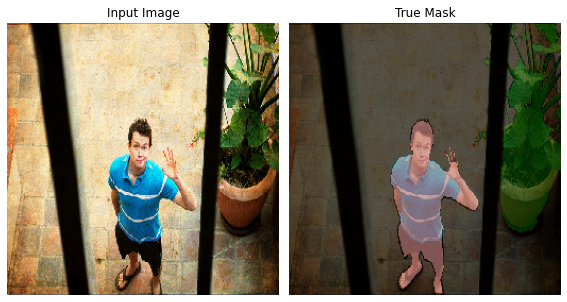

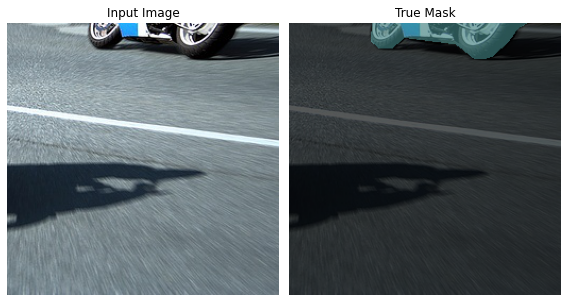

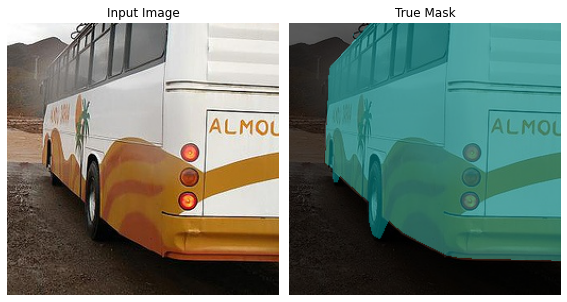

In [ ]:
for image, mask in test_batches.take(3):
    sample_image, sample_mask = image[0], mask[0]
    visSeg.display([sample_image, sample_mask])

### 3.3.3. Define the model



In this section a class for building the **model for segmentation using transfer learning** is defined. We decided to use a U-Net architecture. We adopted this architecture since: 1) It only needs a small set of annotated images, 2) It has a very reasonable training time 3) It is well suited for small and large objects of interest as it is our case. Moreover, it has been proved to perform well in segmentation tasks where fine predictions are required.

As previously mentionated, U-Net architecture is similar to an Autoencoder model with additional skip connections that concatenate the activations from the encoder to the decoder, which duplicates the number of channels in the decoder. **This choice helped us to relieve the bottleneck problem and reduce the loss and improve the quality of the results**.

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=1lP1qQNSS2TX_DgSvgpIJtsniWC5Wi3er">
</p>
<p align="center">Custom U-Net architecture</p> 


The architecture proposed for obtaining the segmentation mask is shown in the Figure above. In a nutshell, the U-Net can be divided into two main parts: an encoder (E) and a decoder (D). In the former, the convolutions downsample the feature maps by a factor of 2. In contrast, the decoder upsample them by the same factor. Specifically, in our implementation, the encoder uses **pretrained layers** extracted from the pretrained model MobileNetV2, see [tensorflow documentation](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/MobileNetV2). On the other hand, the decoder was trained from scratch using modules of the form: $\texttt{(De)Convolution - Batch Normalization - ReLu}$ from the [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) tensorflow example. 

As mentioned, the encoder was constructed using a **pretrained MobileNetV2 model which is pretrained on the ImageNet dataset** to not add bias to our model. This was performed using the ready-to-use model in `tf.keras.applications`. By using a pretrained model, we aimed to:
- **Improve the generalization** and reduce the risk of overfitting.
- **Speed up the training** time, since the pretrained layers are not optimized.
- **Reduce the number of samples** required.
- Overall, obtain a **better segmentation performance**.


Blocks of Convolution - Batch Normalization - and Activation ReLu were used as suggested in [Pix2pix paper]. Moreover, filters of size 3x3 were used. Although it seems small, the use of multiple layers allows us to increase the reception field. Whereas the convolutions have a stride of 2 in all the convolutions layers. Lastly, we implemented in the decoder network simple ReLUs as activation fuctions, except for the last layers which was configured with a linear activation since it was used to compute the loss, see more detail later.

In [ ]:
class UNET():
    def __init__(self, classes, height, width, simage, smask, disObject):
        """
        Initializer for setting the number of classes, images' height and width

        Parameters
        ----------
        model: tf U-Net model
        """
        self.classes = classes
        self.height = height
        self.width = width
        self.model = self.unet_model(self.classes)
        self.display = disObject
        self.sample_image = simage
        self.sample_mask = smask

    def unet_model(self, output_channels:int):
        """
        Defines the architecture of the U-Net model
        Parameters
        ----------
        output_channels: number of classes in the dataset
        Returns
        -------
        overlap: overlaping of RGB and colored mask
        """
        base_model = tf.keras.applications.MobileNetV2(input_shape=[self.height,self.width,3], include_top=False)
        # Use the activations of these layers
        layer_names = ['block_1_expand_relu',
                       'block_3_expand_relu',
                       'block_6_expand_relu',
                       'block_13_expand_relu',
                       'block_16_project']
        base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

        # Create the feature extraction model
        self.down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

        self.down_stack.trainable = False

        self.up_stack = [pix2pix.upsample(256, 3, apply_dropout=True),
                    pix2pix.upsample(128, 3, apply_dropout=True),
                    pix2pix.upsample(64, 3),
                    pix2pix.upsample(32, 3)]

        inputs = tf.keras.layers.Input(shape=[self.height, self.width, 3])
        # Downsampling through the model
        skips = self.down_stack(inputs)
        x = skips[-1]
        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(self.up_stack, skips):
            x = up(x)
            concat = tf.keras.layers.Concatenate()
            x = concat([x, skip])

        # This is the last layer of the model
        last = tf.keras.layers.Conv2DTranspose(filters=output_channels, 
                                               kernel_size=3, 
                                               strides=2,
                                               padding='same')

        x = last(x)

        model =  tf.keras.Model(inputs=inputs, outputs=x)
        return model

    def compile(self):
        """
        It compiles the model for an initial training and tune the parameters for the decoder part
        ----------
        output_channels: number of classes in the dataset
        """
        weights = [1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
        # generator_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
        self.model.compile(optimizer='adam',
                        #    loss=self.DiceLoss,
                           loss=SparseCategoricalFocalLoss(gamma=2, 
                                                           class_weight=weights, 
                                                           from_logits=True),
                           metrics=['accuracy'])
        
    def compileFine(self):
        """
        It compiles the model and configures all the weights as trainables
        ----------
        output_channels: number of classes in the dataset
        """
        weights = [1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
        self.down_stack.trainable = True
        self.model.trainable = True
        generator_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
        self.model.compile(optimizer=generator_optimizer,
                           loss=SparseCategoricalFocalLoss(gamma=2, 
                                                           class_weight=weights, 
                                                           from_logits=True),
                           metrics=['accuracy'])
        
    def create_mask(self, pred_mask):
        """
        Given a prediction output it get the maximum value per channel and returns the segmentation mask
        Parameters
        ----------
        pred_mask: prediction mask of height x width x classes
        Returns
        -------
        pred_mask: segmentation mask
        """
        pred_mask = tf.math.argmax(pred_mask, axis=-1)
        pred_mask = pred_mask[..., tf.newaxis]
        return pred_mask[0]

    def show_predictions(self, dataset=None, num=1):
        """
        Given a dataset and number of samples, computes obtains the predictions and shows the image, label, and prediction
        ----------
        dataset: a tf.dataset object
        num: number of prediction to perform
        """
        if dataset:
            for image, mask in dataset.take(num):
                pred_mask = self.model.predict(image)
                self.display([image[0], 
                            mask[0], 
                            self.create_mask(pred_mask)])
        else:
            pred_mask = self.model.predict(self.sample_image[tf.newaxis, ...])
            self.display([self.sample_image, 
                          self.sample_mask,
                          self.create_mask(pred_mask)])
            


### 3.3.4. Building and compiling the model

Now that the model class has been defined. It is time to create a model instance and configure it to fit our problem. In the next cell, the `UNET` class is called on the number of outputs, size and sample images defined as follows:
- Classes is set to 21 since PASCAL dataset contains 20 classes and 1 additional per background.
- The height and width are set to the same value, so square images are expected.
- The sample image and sample mask are used to show predictions when performing the training and check the training process of the network.

In [ ]:
unet = UNET(classes=21,
            height=size,
            width=size,
            simage = sample_image,
            smask = sample_mask, 
            disObject=visSeg.display)

Having initialized our model `unet.model`, it is time to compile it before training. This is one of the most important steps that define the success or failure since the optimize and loss function chosen depend on the type of the problem and its particular characteristics. 

As previously demonstrated, simple loss functions such as `Categorical Cross Entropy` are suitable given that our problem corresponds to a multiclass segmentation problem. Previously, we have used the `tf.keras.losses.CategoricalCrossentropy` loss function. However, the results were not as good as expected this is mainly:
- There is a big **class imbalance** in the segmentation masks i.e. almost all the images contains background but the other classes have less participation in the dataset so this reduces the performance when using vanilla Categorical Cross Entropy.
- On the other hand, Categorical Cross Entropy fails to distinguish between hard and easy examples, pixels in our case. Hard examples are those in which the model repeatedly makes huge errors, whereas easy examples are those which are easily classified. As a result, Cross Entropy loss fails to pay more attention to hard examples.

Although the first issue could be solved by adding a weighted loss and importance per class, it cannot distinguish between hard and easy examples. Therefore, more useful losses have been defined for addressing uncertainty when making predictions such as focal loss. **Focal loss** achieves this appealing behaviour through something called Down Weighting. Down weighting is a technique that reduces the influence of easy examples on the loss function, resulting in more attention being paid to hard examples. This technique can be implemented by adding a modulating factor to the Cross-Entropy loss: 



As a note appart, see that when compiling the following parameters were set up:
```python
        weights = [1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
        self.model.compile(optimizer='adam',
                           loss=SparseCategoricalFocalLoss(gamma=2, 
                                                           class_weight=weights, 
                                                           from_logits=True),
                           metrics=['accuracy'])
```
- The weight values were defined based on the ratio between background and all the other classes. See that similar imporance is given to all the non-background classes since all or them are equally important.
- By using *adam* as optimizator, we ensure that the learning progress will be smooth and converges fast
- Focal loss is being used as loss function with a parameter of $\gamma=2$ as standard, and using the previously defined weights.
- Additionally, the `from_logits` argument is set to `True`, since the labels are scalar integers instead of vectors of scores for each pixel of every class.
- As metric we are using accuracy, though the loss value will be used as indicador for evaluating the performance of the trained models. 



### 3.3.5. Training the model

Before starting training, the callback class defined below is used to observe how the model improves while it is training. Notice that it will display the prediction and ground truth for an example from the test set, so we can visually check the learning quality of the model.

In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        unet.show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Finally, once the data, model architecture and model hyperparameters have been defined, it is time to start training the model. For doing this, let's use the `fit` method and pass the training and evaluation dataset, the number of epochs to train and the name of the custom callback function. Be aware that after each epoch, the prediction of a sample from the validation set is displayed. *Due to the fact that the training takes a lot of time, we just show the code and some predictions during training.*

```python
EPOCHS = 25
model_history = unet.model.fit(train_batches, 
                               epochs=EPOCHS,
                               validation_data=test_batches,
                               callbacks=[DisplayCallback()])
```
After the first training epoch, an example of a prediction is shown below. As it can be seen the model starts to extract the foreground from the background, yet the color which encode the class is wrong compared to the true mask. 

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=1apTIYJmxw_eMknfL6lpzGy8s41Z56qok">
</p>

The training continued for 25 epochs. During this time, the loss reduced continuously and the prections started to make sense. The figure below shows the prediction for the same validation sample. Notice that the class and most of the mask is fitted to the object (bird in this case). 

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=1KTmuP6JsBmh2j8oKA4jMl2i9MH9nqPXR">
</p>

The prediction looks great! However, there are some artifacts in the boundaries that do not correspond to the segmentation mask. To get rid of them, we applied a **deeper fine tuning** by enabling the training on the encoder `down_stack.trainable=True` and reducing the learning rate to not modify much of the already learned weights in the decoder. The code for doing this is:

```python
unet.compileFine()
EPOCHS = 10
model_history = unet.model.fit(train_batches, 
                               epochs=EPOCHS,
                               validation_data=test_batches,
                               callbacks=[DisplayCallback()])
```

In the figure below we show the effect of training the encoder section. Notice that initial artifacts disappear and the boundaries of the objects are better defined.
<p align="center" >
  <img width="900" src="https://drive.google.com/uc?export=view&id=1nFFUeWmjjYPX4sILmpWFCxiOovd6dwUH">
</p>
<p align="center">Results after fine-tuning the entire model</p> 

From the previous result, we can state that **by further tuning the encoder-decoder a better performance is obtained**. Next, lets visualize the learning curves of the training and validation set. Notice that during the first 25 epochs, only weights of the decoder were being modified since it was created from scratch. Because loss starts to flatten, as this point the entire model is trained. As expected the loss increased for the fist epoch during this second training since the weights of the encoder were being also modified. However, as it can be seen the convergence is faster and after other 20 epochs the loss on the training and validation set reduced even more. 

<p align="center" >
  <img width="500" src="https://drive.google.com/uc?export=view&id=1je4nMUD4i6R1uboAgjYc1dno3a8k_W63">
</p>
<p align="center">Results after fine-tuning the entire model</p> 


Here, we can see that the performance using this **two-stage fine tuning** improves even more. This is because not only the decoder parameter are being updated but also the ones from the encoder section. 

## 3.5. Prediction on the test set using a pretrained model
In this section a pretrained model is load from memory and predictions are performed on the test set for submiting to the competition

In [ ]:
class CustomSegmentationModel:
    """
    Custom segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def __init__(self):
        # self.model = tf.keras.models.load_model('models/128x128_CV_UNet_acc:0.6340_loss:0.5897_val-acc:0.6227_val-loss:1.5179_3.29M_time:13-5-2022@21:47h_DB:PASCAL:Cat:FineTune_E:20x1E-4_Ex:4981/')
        # self.model = tf.keras.models.load_model('models/128x128_CV_UNet_acc:0.6522_loss:0.4791_val-acc:0.6757_val-loss:0.7408_3.81M_time:18-5-2022@16:2h_DB:PASCAL:Cat:FineTune_E:20x1E-4_Ex:4981')
        # self.model = tf.keras.models.load_model('models/224x224_CV_UNet_acc:0.8483_loss:0.6365_val-acc:0.8198_val-loss:0.6351_3.81M_time:18-5-2022@18:40h_DB:PASCAL:Cat:FineTune_E:20x1E-4_Ex:4981/')
        # self.model = tf.keras.models.load_model('256x256_CV_UNet_acc:0.8717_loss:0.4934_val-acc:0.8853_val-loss:0.5426_3.81M_time:19-5-2022@9:20h_DB:PASCAL:Cat:FineTune_E:20x1E-4_Ex:4981')
        self.model = tf.keras.models.load_model('256x256_CV_UNet_acc:0.9049_loss:0.3408_val-acc:0.8774_val-loss:0.3752_3.81M_time:22-5-2022@10:52h_DB:PASCAL:Cat:FineTune_E:20x1E-4_Ex:4981')
       
    def predict(self, test_df):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        predictions: list of arrays - n x (height x width)
        """
        predictions = []
        for i in range(750):
            print(f'Processing {i}/750',end='\r')
            test_image = test_df.iloc[i]['img']
            (h,w,_) = test_image.shape
            tf_image = tf.convert_to_tensor(test_image)
            tf_image = tf.image.resize(tf_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
            tf_image = tf.cast(tf_image, tf.float32) / 255.0
            output = self.model.predict(tf_image[tf.newaxis, ...])
            output = tf.image.resize(output, [h, w], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

            # output = output.numpy()
            # categories = np.array(test_df.iloc[i][0:20])
            # min_val = output.min()
            # ch_keep = np.where(categories==1)
            # for i in range(20):
            #     if i not in ch_keep[0]:
            #         output[0,:,:,i+1] = min_val
            
            maskted = self.create_mask(tf.convert_to_tensor(output)).numpy()[:,:,0]
            predictions.append(np.uint8(maskted))
        return predictions
    
    def create_mask(self, pred_mask):
        pred_mask = tf.argmax(pred_mask, axis=-1)
        pred_mask = pred_mask[..., tf.newaxis]
        return pred_mask[0]

    def __call__(self, X):
        return self.predict(X)

In [ ]:
smodel = CustomSegmentationModel()
test_df.loc[:, "seg"] = smodel.predict(test_df)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3162: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


### 3.5.1. Visualization of the predictions
Now that the predictions have been performed on the test set, lets visualize them and color the predictions acording to the color coding for the PASCAL dataset. Notice that the true labels for the test set are not available; thus, the correctness of the predictions are evaluated qualitatively.

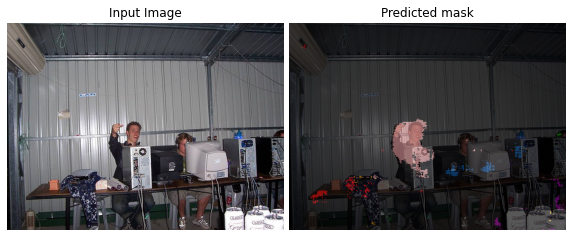

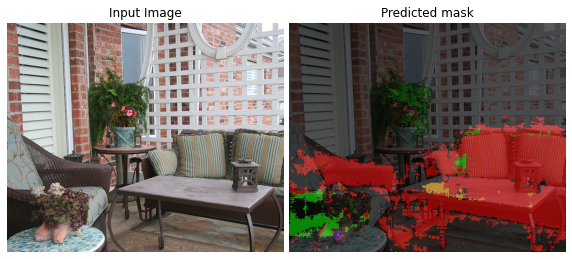

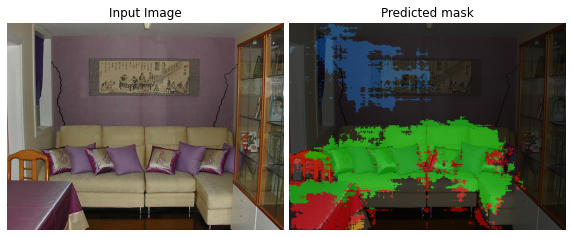

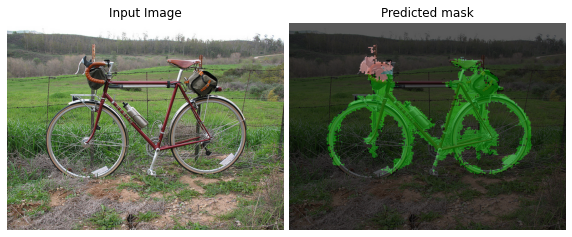

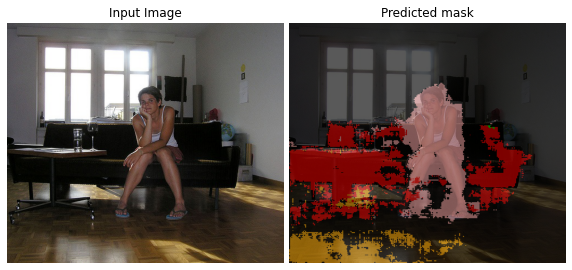

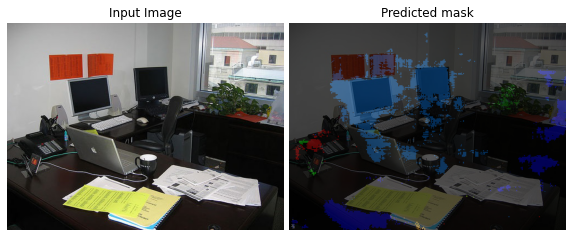

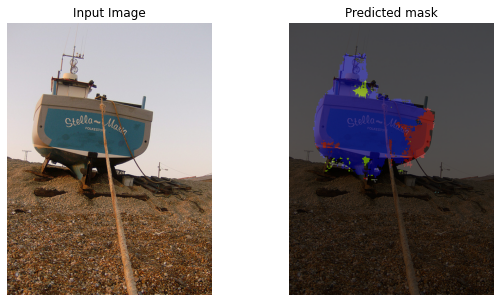

In [ ]:
max = 5
for i,(sample_image, sample_mask) in enumerate(zip(test_df['img'],test_df['seg'])):
    visSeg.display([sample_image, sample_mask], ['Input Image','Predicted mask'])
    if i>max:
        break

### 3.5.2. Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [ ]:
test_df.head(5)

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[146, 95, 92], [131, 87, 84], [156, 137, 133...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[121, 122, 108], [121, 122, 106], [125, 122,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[255, 255, 255], [255, 255, 255], [255, 255,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[71, 69, 74], [73, 71, 76], [80, 78, 83], [7...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


In [ ]:
labels = train_df.columns
generate_submission(test_df)

# 4. Adversarial attack

## 4.1. Introduction


An adversarial attack on a machine learning algorithm tries to deceive the algorithm into giving a wrong output by means of specifically engineered input.

While misclassifying a panda as a gibbon sounds innocent, there are more use cases to adversarial machine learning than this. Take for example a spam filter. If you can create a combination of words that classifies an e-mail as no spam despite the rest of the e-mail being spam, you will be able to reach more unsuspecting people with that mail. Another more serious example would be finding a filter or texture that can be applied on a stop sign that is invisible to the human eye but results in self-driving cars no longer detecting the stop sign. Those cars will run the stop sign, resulting in accidents and possibly people dying. However, not all adversarial attacks are with malicious. Finding such adversial examples uncovers weaknesses of your system. Solving these weaknesses makes the system stronger against future attacks.

The 4 most common types of adversarial attacks are:

*   **Evasion**: This is described in the paragraph above. The goal of evasion is to misclassify objects to e.g. evade spam filter. Fooling a biometrics system into thinking you are someone else also falls into this category. Here we try 2 different techniques to execute an evasion attacks.
*   **Poisoning**: Here we attack the training set. By implanting own data or modifying the labels of the training set, you create a very specific and personal angle of attack on the system. This technique works better on system that often need retraining as it results in more opportunities to attack the training set.
*   **Model stealing**: Just as the name suggest, we are interested in inferring information about the model, be it architecture or even training data. The training data can contain sensitive data such as names and associated medical conditions.
*   **Inference**: The goal of inference is partially the same as model stealing: obtaining training data. The method is however different. During inference, one assumes that there is some degree of overfitting on the training data and tries to infer the training data from this overfitting. This implies that models that generalize well are more secure against inference attacks.


<p align="center" >
  <img width="500" src="https://drive.google.com/uc?export=view&id=1xcTnEhP7h2RhLnd6NZAmVV4xq_Nlgaxt">
</p>
<p align="center">Example of an evasion attack in a self-driving car setting</p> 

For our evasion to be succesful, we need to fulfil two criteria: firstly, our neural network needs to actually predict a wrong class. Secondly, the perturbed image should still look like the original image.

For both methods, we assume a white box framework: we consider that the hacker has infiltrated our system and knows exactly our model. For the first method we have the following scenario: the hacker wants to perturb the images such that our classifier alsways predicts a motorbike instead of a bicycle. After spending some years in Leuven, he developed a **hatred against bicycles** and his new purpose in life is to attack all classifiers so that no one can predict the bicycle class. The second situation is a bit broader. Taking any image with an object our neural net can classify, we can create a perturbation to add to the image and completely fool the classifier.

## 4.2. Implementation

###4.2.1 Deceptive label generation





The hacker has to first generate **deceptive labels**. We will look at the images containing the label "bicycle" and replace the "1" by "0". We will then add "1" for the motorbike value

In [ ]:
#let's first merge training and validation of the previous steps
print(X_train_normalized.shape,X_val_normalized.shape,y_train.shape, y_val.shape )
X_train_normalized = np.append(X_train_normalized,X_val_normalized, axis=0)
y_train = y_train.append(y_val) 
print(X_train_normalized.shape,y_train.shape)

(711, 224, 224, 3) (38, 224, 224, 3) (711, 20) (38, 20)
(749, 224, 224, 3) (749, 20)


Let's extract from the dataset the **bicycles images**.

In [ ]:
#bicycle is class number "1" 

X_train_bicycle = []
y_train_bicycle = []
for i in range(len(y_train)):
    if y_train.iloc[i][1] == 1:
         X_train_bicycle.append(np.array([X_train_normalized[i]]))  
         y_train_bicycle.append(np.array(y_train.iloc[i]))

X_train_bicycle = np.squeeze(X_train_bicycle)
y_train_bicycle = np.squeeze(y_train_bicycle)


#keep original labelling : 
y_train_bicycle_original = y_train_bicycle.copy()

We must **change their labelling onto moterbikes labelling**, i.e. class number 13

In [ ]:
for i in range(len(y_train_bicycle)-1):
    #replace bicycle position by 0
    if int(y_train_bicycle[i][1]) == 1:
        y_train_bicycle[i][1] = 0
    #add 1 to motorbike position (if already 1, does not change)
    y_train_bicycle[i][13] = 1


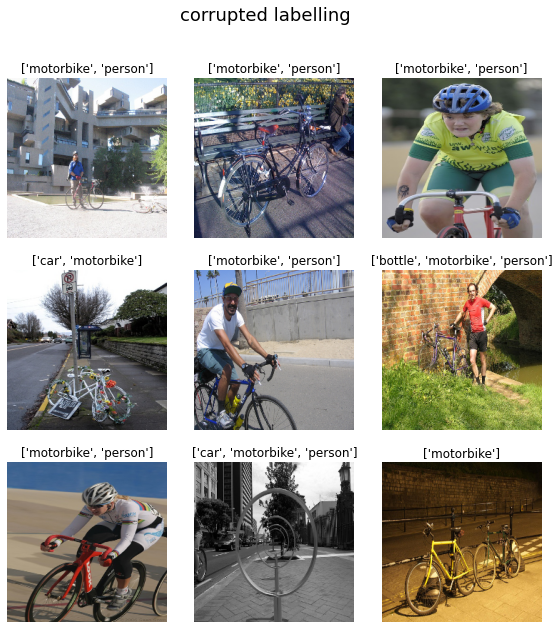

In [ ]:
fig=plt.figure(figsize=(10, 10))
plt.subplots_adjust(hspace=0.2, wspace=0.02)
columns = 3
rows = 3

for i in range(columns * rows):

    img = X_train_bicycle[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.suptitle("corrupted labelling",fontsize = 18)
    plt.title(get_predicted_class(y_train_bicycle[i]))
    plt.axis('off')
    
plt.show()

That is the **corrupted labelling the hacker want**, i.e. y_dec. Now, he will train the autoencoder that will add noise to the image in order to perturb the prediction of the classifier. We minimize the loss between the predicted label **y_pred from the classifier and the deceptive label y_dec**

###4.2.2 Encoder-decoder 

The idea here is to **implement and train an encoder-decoder**. Given an image X and a desired deceptive label y_dec, the encoder-decoder will generate a **perturbation** that we will add to X in such a way that the attacked classifier will classify X as y_dec instead of y.

We will first train the classifier to correctly classify the input image. Then, we will freeze the weights of the classifier, to train an autoencoder to add a perturbation on the image in order to **fool the classifier**. In a way, this approach is *similar* to a GAN, but the difference is that the classifier (which can be seen as the discriminator) is trained before the autoencoder (which can be seen as the generator). The idea is presented in the figure below : 

<p align="center" >
  <img width="600" src="https://drive.google.com/uc?export=view&id=1Qm-NyLxD6Vs1r8DHqkU5dONsyv9PTVYH">
</p>

**<ins>Let's define the problem as a binary classification problem</ins>**

Due to the fact that we don't have a lot of bicycle samples, let's just redefine the problem as **binary classification**. We train with the original labels, with only one output with a sigmoid classification : we want to classify the input images as bicycle or motorbike. We define the labels as 

- 1 for bicycle
- 0 for motorbike



<ins>Original labels</ins>

In [ ]:
y_train_bicycle_original_binary = []

#we create a list of binary labels : "1" because bicycle
for i in range(len(y_train_bicycle_original)):
    y_train_bicycle_original_binary.append(1)

y_train_bicycle_original_binary = np.array(y_train_bicycle_original_binary)
y_train_bicycle_original_binary = y_train_bicycle_original_binary.astype(float)

<ins>Deceptive labels</ins>

In [ ]:
y_train_bicycle_deceptive_binary = []

#we create a list of binary labels : "0" because motorbike
for i in range(len(y_train_bicycle_original)):
    y_train_bicycle_deceptive_binary.append(0)

y_train_bicycle_deceptive_binary = np.array(y_train_bicycle_deceptive_binary)
y_train_bicycle_deceptive_binary = y_train_bicycle_deceptive_binary.astype(float)

For the classifier, we will again **use MobileNet** as we did in the first part of the assignment

In [ ]:
#based on https://www.tensorflow.org/tutorials/images/transfer_learning

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense

base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
base_model.trainable = False


model = Sequential([
  base_model,
  GlobalAveragePooling2D(),
  Dropout(0.5),
  Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss=loss,
              metrics="accuracy")

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_3 (Dropout)         (None, 1280)              0         
                                                                 
 dense_1 (Dense)             (None, 1)                 1281      
                                                                 
Total params: 2,259,265
Trainable params: 1,281
Non-trainable params: 2,257,984
_________________________________________________________________


Let's train the classifier to **predict the original binary labels**

In [ ]:
hist = model.fit(X_train_bicycle, y_train_bicycle_original_binary, epochs=4, verbose=1)

Epoch 1/4
2/2 [==============================] - 5s 19ms/step - loss: 3.4468 - accuracy: 0.4615
Epoch 2/4
2/2 [==============================] - 0s 15ms/step - loss: 1.7985 - accuracy: 0.7436
Epoch 3/4
2/2 [==============================] - 0s 15ms/step - loss: 1.0242 - accuracy: 0.8462
Epoch 4/4
2/2 [==============================] - 0s 14ms/step - loss: 0.4522 - accuracy: 1.0000


In [ ]:
for layer in model.layers:
    layer.trainable = False

It's time to define the **`autoencoder architecture`**. The input needs to be of the shape of the image, as well as the output.

In [ ]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense,Input, UpSampling2D,Conv2D,BatchNormalization,Activation,MaxPooling2D,ActivityRegularization,Add, Lambda

#image shape : same as input image we deal with
input_shape = (224,224,3)

#we will first downsample the image using maxpooling with the encoder
input_image = Input(shape=input_shape)
x = Conv2D(128, (3, 3), padding='same')(input_image)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
encodeded_image = MaxPooling2D((2, 2), padding='same')(x)


#we upsample then the image to have again the shape (224,224,3)
x = Conv2D(32, (3, 3), padding='same')(encodeded_image)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(3, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
decoded_image = Activation('sigmoid')(x)


We can now make the different **connection between the networks** as we have seen in the diagram of the beginning of the section.

In [ ]:
#Add perturbation
#based on https://www.programcreek.com/python/example/112562/tensorflow.compat.v1.clip_by_value
def addpert(args):
    perturbation,input_image = args
    b = K.clip(perturbation+input_image,0,1)
    return b

perturbation = decoded_image
perturbed_image = Lambda(addpert, output_shape=input_shape, name='perturb')([perturbation,input_image])

# Use classifier from previous section
outputs = model(perturbed_image)

In [ ]:
batch_size=8
training = False

adv_attack = tf.keras.Model(input_image, outputs, name='attack')
adv_attack.compile(optimizer='adam',loss='binary_crossentropy', metrics = ['accuracy'])

Now, we can **train the adversarial network**

In [ ]:
def train_adv(training=0):
    """
    Training function of the adversarial network.
    Input : 
    
        - training:
                * if training==0, we load the stored weights
                * if training==1, we train the adversarial network and plot the result         
    """
    if training == 0:
         adv_attack.load_weights("adv_attack")
    elif training ==1:
        adv_attack.fit(X_train_bicycle, y_train_bicycle_deceptive_binary,
              batch_size=4,
              epochs=2,
              verbose=1)

In [ ]:
train_adv(training=0)

Let's now see how the model perform. We will report the **`Adversarial attack success`**, which will be given by the **ratio between successful attack** (the classifier predict motorbike for the bicycle image) **and the total number of samples**

In [ ]:
from sklearn.metrics import accuracy_score


prediction = adv_attack.predict(X_train_bicycle)
prediction[prediction>=0.5] = 1
prediction[prediction<0.5] = 0
print("Adversarial attack success on training = ",accuracy_score(prediction,y_train_bicycle_deceptive_binary))

Adversarial attack success on training =  0.48717948717948717


We can observe that for around half of the samples, the **adversarial attack is successful**

 An example of a perturbed image is shown below. As humans, we can **still identify the bicycle**. Note that for this attack, we have to find a *trade-off* between the strength of the attack and the attack success we want. If we define a very strong attack (with a powerfull auto-encoder architecture or a network trained for a lot of epochs e.g.), the adversarial attack success rate will be high but the image will be difficult to recognize even for humans.

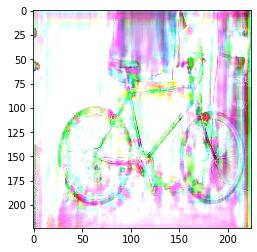

In [ ]:
perturbed_image = tf.keras.Model(inputs=adv_attack.input,outputs=adv_attack.get_layer('perturb').output).predict(X_train_bicycle)
plt.imshow(perturbed_image[9])

**The trade-off between adversarial attack success and pertubation** on images is shown at the figure below : 

<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1RkmnJfAEjbg7Wme9-9BlviKLkpU4V4lX
", style="width: 700px;">
</p>


### 4.2.2 Fast Gradient Sign Method

Another method of generating adversarial images is by using the Fast Gradient Sign Method (FGSM). This method was used to generate the famous example where a panda was classified as a gibbon with a high level of confidence, even though the picture looks like a panda to humans. The idea of the FGSM is to create a perturbative image, unique per input image, that *maximizes* the loss for that image. We can achieve this using the gradient of the loss of said input image. This idea can be written in formulaic form as

$x_{adv} = x + ϵ⋅sign(∇_xJ(θ, x, y))$

with $x_{adv}$ and $x$ our adversarial and original image respectively, $\epsilon$ a small perturbation multiplier and $J(\theta, x, y)$ the loss with respect to the model parameter, original image and original image label.

<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1xbcy5-E5qJk29c_g8oTQshZY077b9urn
", style="width: 700px;">
</p>
<p align="center">Example of how the FGSM works</p> 


This method is easy to implement and very fast, with the only constraint that we need to be able to access the entire model and its weights (so it is an open box approach, just as the previous method). To show the power of this method, we will misclasify 2 images taken at random from a Google search: a bike and a plane. These image were not used in training the original model

The model we use is the classifier based on transfer learning from section 2.3, along with the weights obtained by training on the PASCAL VOC 2009 dataset

In [ ]:
base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
base_model.trainable = False


model = Sequential([
  base_model,
  GlobalAveragePooling2D(),
  Dropout(0.5),
  Dense(20, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss=loss,
              metrics="accuracy")

model.load_weights("checkpoint_85")

We load the image, display it and apply the right preprocessing steps to it so that it can be classified by the neural network

In [ ]:
def load_display_process(path):
  img = np.load(path)
  # resize
  img = np.array(tf.image.resize(img, [224, 224]))
  # normalize pixel values
  img = img/255
  # display the image
  plt.imshow(img)
  # transform image from (224, 224, 3) to (1, 224, 224, 3)
  img = img[np.newaxis,:]
  return img


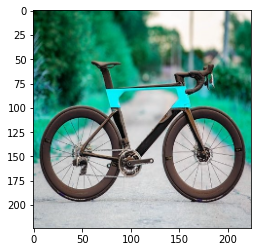

In [ ]:
img = load_display_process("/content/bike.npy")

We now create our perturbation image. The gradient of a model can be easily calculated using the `tf.GradientTape()` method. We also create a function to nicely display the labels of an image.

In [ ]:
def print_labels(label_score, labels, threshold=0.5):
    sort_index = np.argsort(label_score)
    sorted_score = label_score[sort_index][::-1]
    
    sorted_labels = labels[sort_index][::-1]
    for i, score in enumerate(sorted_score):
        if score > threshold:
            print("detected {} with score {:.2f}".format(sorted_labels[i], sorted_score[i]))
        elif i == 0:
            print("No objects detected with certainty above the threshold")
            print("Best result: {} with score {:.2f}".format(sorted_labels[i], sorted_score[i]))
        else:
            break

    return None
    

def create_adversarial_pattern(image, model, loss, labels, threshold=0.5):
    # NOTE: this function assumes the labels predicted by the neural network (aka above the threshold) are the true labels of the image!
    label_score = model.predict(image)
    print_labels(label_score[0], labels, threshold)
    pred_labels = np.where(label_score > threshold, 1, 0)

    # convert to tensors
    image_tensor = tf.convert_to_tensor(img, dtype=tf.float32)
    label_tensor = tf.convert_to_tensor(pred_labels, dtype=tf.float32)

    with tf.GradientTape() as tape:
        tape.watch(image_tensor)
        losses = loss(label_tensor, model(image_tensor))

        gradient = tape.gradient(losses, image_tensor)
        signed_gradient = tf.sign(gradient)

    return signed_gradient



In [ ]:
perturbation = create_adversarial_pattern(img, model, loss, labels)
plt.imshow(perturbation[0])

TypeError: ignored

Let us now add this perturbation to the original image with different intensities

In [ ]:
def visualize_perturbation_effect(image, perturbation, epsilons, model, labels, threshold=0.5):
    for i, eps, in enumerate(epsilons):
        adv_x = image + eps*perturbation
        adv_x = tf.clip_by_value(adv_x, 0,1)
        result = model.predict(adv_x)
        plt.imshow(adv_x[0])
        print_labels(result[0], labels, threshold)
        plt.show()

    return None

In [ ]:
epsilons = [0, 0.005, 0.01, 0.05, 0.1]
visualize_perturbation_effect(img, perturbation, epsilons, model, labels)

The neural network is fooled even though there is only a small perturbation present in the image, hardly visible to the human eye. As we increase the intensity of the perturbation, it becomes more visible for humans, but the neural network gets more confused as well. We can distinguish a couple of different scenarios.

The first is where the neural network misclasifies an object as another object. These objects do bear some resemblance between them (e.g. bike-motorcycle or plane-bird). The second scenario is where the permutation becomes so strong that the network no longer recognizes any object with a sufficiently high certainty. In the last scenario, ading the permutation makes the neural net believe the original object is still present, but some other objects are present aswell.

From adding these perturbations, we learn that the classifier looks at both the object and its environment. Instead of a bike, we detect a motorcycle or car, both objects with wheels that could stand on a road surrounded by trees. In the example below, we detect a bird instead of an airplane. Both categories are often present in the sky with clouds in the image.

All in all, this method seems to produce perturbations that are a lot less visible to the human eye than the previous method, depending on the value of epsilon. The FGSM is also easier to implement and out of the box works with images that are not present in the training set of the original model. It is however less precise than the autoencoder model. We cannot influence the perturbed label as we simply maximize the loss with respect to the original label, disregarding any desired perturbed labels.

Below is a second example, now with a plane instead of a bike to show the ease of use and flexibility of this method. We do not need to train any additional neural networks, but simply need to provide images for the FGSM to generate the perturbative noise.

In [ ]:
img = load_display_process("/content/plane.npy")
perturbation = create_adversarial_pattern(img, model, loss, labels)
visualize_perturbation_effect(img, perturbation, epsilons, model, labels)

# 5. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.

## 5.1. Image classification discussion

From the image classification part, we can report the following points :

- The dataset is highly imbalanced : using **classweights** in the loss function is important to have a nonbiased classifier
- The dataset is rather small : we have 749 training samples for 20 class, and we crop the image to a 224x224 dimensions. Training a CNN from scratch is therefore very difficult, because we have a **high dimensional data** with 50176 dimensions (224.224 = 50176) for only 749 training samples. Therefore, D=50176>>N=749. **Convolutional Neural Network** are suitable to deal with such highly dimensional data because they use a local receptive fields, which reduces a lot the number of connections needed. However, when D>>N, it will be difficult to have a model that generalizes well. 
- When training a CNN **from scratch**, we have low performance : f1=0.19
- When using **transfer learning** from a MobileNet architecture which was trained on ImageNet, performance is much better : f1=0.99 
- By **visualizing the prediction** on the test set, we are able to see that the predictions are coherent.  

## 5.2. Image segmentaion Discussion 

From the previous experiments we can sumarize the following findings for the segmentation problem:
- Because reduced size of the training set, special techniques were needed to obtain an acceptable performance. Specifically, **transfer learning turned out to be very helpful**.
- Similarly, the class imbalance in the segmentation mask was also a challenge since, initial segmentation attemps turned out to predict everything as background due to its prevalence. Thus, **Focal Loss let us improve the results** since it helped us to handle class imbalance by adding weights to the loss of each class.  
- Additionally, by **wisely cropping the images along with their masks**, the initial dataset was increased, which was very important to **increase the generalization**
- Because the initial dataset of `749` samples was extended to `5243`, **we were able to train a bigger model with 3M parameters**, which solved the underfitting issue with the scratch model. However, this also represented a challenge with regards to computational resources.
- By using **two stages for fine-tuning**, the segmentation model was able to achieve a considerably small loss value. 

Overall, image segmentation is a difficult problem of the computer vision field. Moreover, the multiclass nature of the problem and the reduced dataset size represent additional challenges that required extra work. 

## 5.3. Adversarial attacks discussion

We have tested two different techniques to create a perturbation that results in an evasion attack: autoencoders and FGSM



*   The autoencoder method is **extremely versatile**: we can choose as what other object we want a class to be classified as instead.
*   However, it becomes apparent quite quickly for a human that there was some tampering with the image if the attack wants to be successful.
*   The **FGSM is more subtle** than autoencoders, but less flexible at the same time: we cannot choose as what the perturbed image will be classified as.
*   **The perturbation strength of both techniques can be regulated**: for the autoencoder the strength is dictated by the number of training epochs. For the FGSM, the parameter epsilon controls the strength.



